In [4]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib import pyplot

In [5]:
df = pd.read_csv(r"C:\Users\PC\Downloads\Clicked Ads Dataset.csv")

In [6]:
df.head()

,Unnamed: 0,Daily Time Spent on Site,Age,Area Income,Daily Internet Usage,Male,Timestamp,Clicked on Ad,city,province,category
0,0,68.95,35,432837300.0,256.09,Perempuan,3/27/2016 0:53,No,Jakarta Timur,Daerah Khusus Ibukota Jakarta,Furniture
1,1,80.23,31,479092950.0,193.77,Laki-Laki,4/4/2016 1:39,No,Denpasar,Bali,Food
2,2,69.47,26,418501580.0,236.50,Perempuan,3/13/2016 20:35,No,Surabaya,Jawa Timur,Electronic
3,3,74.15,29,383643260.0,245.89,Laki-Laki,1/10/2016 2:31,No,Batam,Kepulauan Riau,House
4,4,68.37,35,517229930.0,225.58,Perempuan,6/3/2016 3:36,No,Medan,Sumatra Utara,Finance


In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 11 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Unnamed: 0                1000 non-null   int64  
 1   Daily Time Spent on Site  987 non-null    float64
 2   Age                       1000 non-null   int64  
 3   Area Income               987 non-null    float64
 4   Daily Internet Usage      989 non-null    float64
 5   Male                      997 non-null    object 
 6   Timestamp                 1000 non-null   object 
 7   Clicked on Ad             1000 non-null   object 
 8   city                      1000 non-null   object 
 9   province                  1000 non-null   object 
 10  category                  1000 non-null   object 
dtypes: float64(3), int64(2), object(6)
memory usage: 86.1+ KB


In [8]:
#menghapus kolom unnamed
df.pop('Unnamed: 0')

0        0
1        1
2        2
3        3
4        4
      ... 
995    995
996    996
997    997
998    998
999    999
Name: Unnamed: 0, Length: 1000, dtype: int64

In [9]:
df.head()

,Daily Time Spent on Site,Age,Area Income,Daily Internet Usage,Male,Timestamp,Clicked on Ad,city,province,category
0,68.95,35,432837300.0,256.09,Perempuan,3/27/2016 0:53,No,Jakarta Timur,Daerah Khusus Ibukota Jakarta,Furniture
1,80.23,31,479092950.0,193.77,Laki-Laki,4/4/2016 1:39,No,Denpasar,Bali,Food
2,69.47,26,418501580.0,236.50,Perempuan,3/13/2016 20:35,No,Surabaya,Jawa Timur,Electronic
3,74.15,29,383643260.0,245.89,Laki-Laki,1/10/2016 2:31,No,Batam,Kepulauan Riau,House
4,68.37,35,517229930.0,225.58,Perempuan,6/3/2016 3:36,No,Medan,Sumatra Utara,Finance


In [10]:
num = ['Daily Time Spent on Site','Age','Area Income','Daily Internet Usage']
cat = ['Male','Clicked on Ad','city','province','category']

In [11]:
df[num].describe()

,Daily Time Spent on Site,Age,Area Income,Daily Internet Usage
count,987.000000,1000.000000,9.870000e+02,989.000000
mean,64.929524,36.009000,3.848647e+08,179.863620
std,15.844699,8.785562,9.407999e+07,43.870142
min,32.600000,19.000000,9.797550e+07,104.780000
25%,51.270000,29.000000,3.286330e+08,138.710000
50%,68.110000,35.000000,3.990683e+08,182.650000
75%,78.460000,42.000000,4.583554e+08,218.790000
max,91.430000,61.000000,5.563936e+08,267.010000


In [12]:
df[cat].describe()

,Male,Clicked on Ad,city,province,category
count,997,1000,1000,1000,1000
unique,2,2,30,16,10
top,Perempuan,No,Surabaya,Daerah Khusus Ibukota Jakarta,Otomotif
freq,518,500,64,253,112


In [13]:
# Menggunakan np.logical_and untuk menggabungkan kondisi
df['category_age'] = np.where(np.logical_and(df['Age'] >= 11, df['Age'] <= 25), 'remaja',
                               np.where(np.logical_and(df['Age'] >= 26, df['Age'] <= 45), 'dewasa', 'lansia'))


In [14]:
df.head()

,Daily Time Spent on Site,Age,Area Income,Daily Internet Usage,Male,Timestamp,Clicked on Ad,city,province,category,category_age
0,68.95,35,432837300.0,256.09,Perempuan,3/27/2016 0:53,No,Jakarta Timur,Daerah Khusus Ibukota Jakarta,Furniture,dewasa
1,80.23,31,479092950.0,193.77,Laki-Laki,4/4/2016 1:39,No,Denpasar,Bali,Food,dewasa
2,69.47,26,418501580.0,236.50,Perempuan,3/13/2016 20:35,No,Surabaya,Jawa Timur,Electronic,dewasa
3,74.15,29,383643260.0,245.89,Laki-Laki,1/10/2016 2:31,No,Batam,Kepulauan Riau,House,dewasa
4,68.37,35,517229930.0,225.58,Perempuan,6/3/2016 3:36,No,Medan,Sumatra Utara,Finance,dewasa


In [15]:
df['category_age'].value_counts()

category_age
dewasa    745
lansia    157
remaja     98
Name: count, dtype: int64

# EDA

In [16]:
r = df.groupby('category_age').agg({'Daily Time Spent on Site':'mean'}).reset_index()

C:\Users\PC\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\PC\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\PC\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


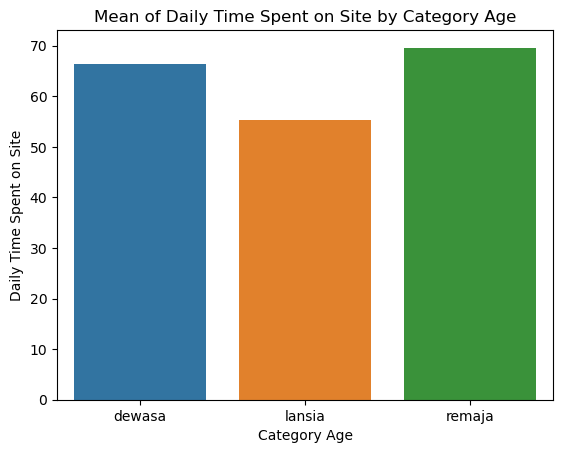

In [17]:
sns.barplot(data=r, x='category_age', y='Daily Time Spent on Site')

# Menambahkan label sumbu dan judul
plt.xlabel('Category Age')
plt.ylabel('Daily Time Spent on Site')
plt.title('Mean of Daily Time Spent on Site by Category Age')

# Menampilkan plot
plt.show()

remaja memiliki rata rata daily time spent on site paling tinggi dan lansia memliki rata rata yang kecil


In [18]:
g= df.groupby('category_age').agg({'Area Income':'mean'}).reset_index()

C:\Users\PC\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\PC\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\PC\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


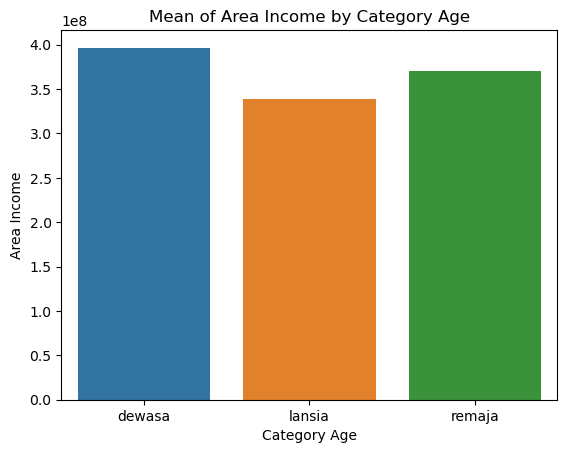

In [19]:
sns.barplot(data=g, x='category_age', y='Area Income')

# Menambahkan label sumbu dan judul
plt.xlabel('Category Age')
plt.ylabel('Area Income')
plt.title('Mean of Area Income by Category Age')

# Menampilkan plot
plt.show()

kategori dewasa memilki rata rata pendapatan yang besar dari yang lain

In [20]:
gt = df.groupby('category_age').agg({'Daily Internet Usage':'mean'}).reset_index()
gt

,category_age,Daily Internet Usage
0,dewasa,183.055672
1,lansia,155.527885
2,remaja,194.903542


C:\Users\PC\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\PC\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\PC\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


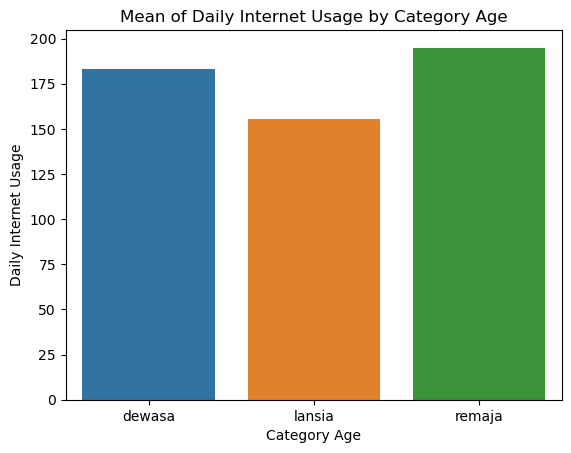

In [21]:
sns.barplot(data=gt, x='category_age', y='Daily Internet Usage')

# Menambahkan label sumbu dan judul
plt.xlabel('Category Age')
plt.ylabel('Daily Internet Usage')
plt.title('Mean of Daily Internet Usage by Category Age')

# Menampilkan plot
plt.show()

remaja memiliki rata rata penggunaan internet paling tinggi


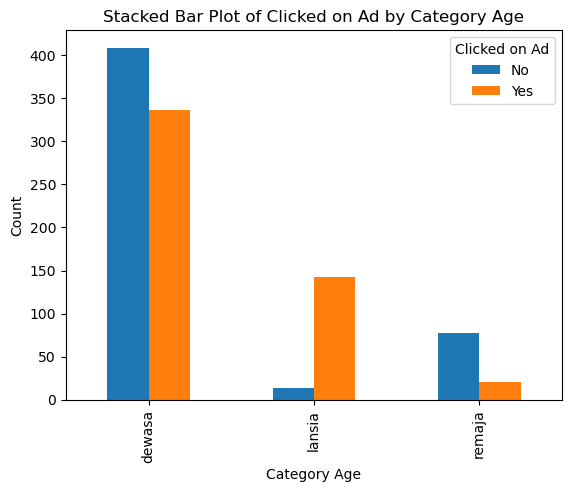

In [22]:
# Assuming 'result' is the DataFrame you created
result = df.groupby(['category_age', 'Clicked on Ad']).size().unstack()

# Create bar plot
result.plot(kind='bar', stacked=False)

# Add labels and title
plt.xlabel('Category Age')
plt.ylabel('Count')
plt.title('Stacked Bar Plot of Clicked on Ad by Category Age')

# Show legend
plt.legend(title='Clicked on Ad', loc='upper right')

# Show plot
plt.show()


perbandingan yang menekan iklan yang paling banyak di kategori lansia lebih banyak menekan iklan dari pada tidak


In [23]:
df['Timestamp'] = pd.to_datetime(df.Timestamp)

In [24]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 11 columns):
 #   Column                    Non-Null Count  Dtype         
---  ------                    --------------  -----         
 0   Daily Time Spent on Site  987 non-null    float64       
 1   Age                       1000 non-null   int64         
 2   Area Income               987 non-null    float64       
 3   Daily Internet Usage      989 non-null    float64       
 4   Male                      997 non-null    object        
 5   Timestamp                 1000 non-null   datetime64[ns]
 6   Clicked on Ad             1000 non-null   object        
 7   city                      1000 non-null   object        
 8   province                  1000 non-null   object        
 9   category                  1000 non-null   object        
 10  category_age              1000 non-null   object        
dtypes: datetime64[ns](1), float64(3), int64(1), object(6)
memory usage: 86.1+ KB


In [25]:
df['month'] = df['Timestamp'].dt.month

In [26]:
df.head()

,Daily Time Spent on Site,Age,Area Income,Daily Internet Usage,Male,Timestamp,Clicked on Ad,city,province,category,category_age,month
0,68.95,35,432837300.0,256.09,Perempuan,2016-03-27 00:53:00,No,Jakarta Timur,Daerah Khusus Ibukota Jakarta,Furniture,dewasa,3
1,80.23,31,479092950.0,193.77,Laki-Laki,2016-04-04 01:39:00,No,Denpasar,Bali,Food,dewasa,4
2,69.47,26,418501580.0,236.50,Perempuan,2016-03-13 20:35:00,No,Surabaya,Jawa Timur,Electronic,dewasa,3
3,74.15,29,383643260.0,245.89,Laki-Laki,2016-01-10 02:31:00,No,Batam,Kepulauan Riau,House,dewasa,1
4,68.37,35,517229930.0,225.58,Perempuan,2016-06-03 03:36:00,No,Medan,Sumatra Utara,Finance,dewasa,6


In [27]:
nama_bulan = {1: 'Januari', 2: 'Februari', 3: 'Maret', 4: 'April', 5: 'Mei', 6: 'Juni',
              7: 'Juli', 8: 'Agustus', 9: 'September', 10: 'Oktober', 11: 'November', 12: 'Desember'}

# Menggunakan fungsi map untuk mengubah angka bulan menjadi nama bulan
df['nama_bulan'] = df['month'].map(nama_bulan)

Text(0, 0.5, 'jumlah')

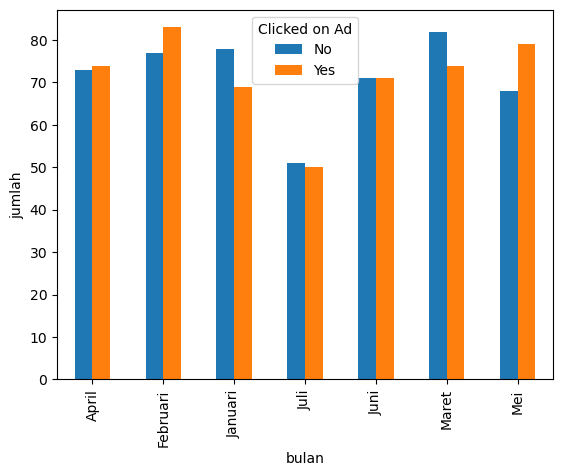

In [28]:
gt =  df.groupby(['nama_bulan', 'Clicked on Ad']).size().unstack()
gt.plot(kind='bar', stacked=False)
plt.xlabel('bulan')
plt.ylabel('jumlah')

bulan februari memiliki jumlah penekan iklan yang tinggi dari bulan lain, dan jumlah orang yang tidak menekan iklan di bulan maret yang paling tinggi

In [29]:
x= df.groupby('month').agg({'Daily Internet Usage':'mean'}).reset_index()

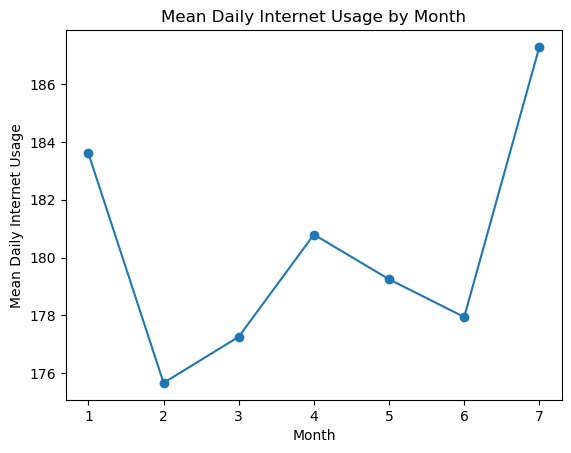

In [30]:
grouped_data = df.groupby('month').agg({'Daily Internet Usage': 'mean'}).reset_index()

# Plot the data
plt.plot(grouped_data['month'], grouped_data['Daily Internet Usage'], marker='o')
plt.xlabel('Month')
plt.ylabel('Mean Daily Internet Usage')
plt.title('Mean Daily Internet Usage by Month')
plt.show()

bulan juli memiliki rata rata penggunaan internet harian yang tinggi, dan bulan februari memilki rata rata yang paling rendah


In [31]:
grouped_data = df.groupby('month').agg({'Daily Internet Usage': 'mean'}).reset_index()
grouped_data

,month,Daily Internet Usage
0,1,183.602740
1,2,175.664522
2,3,177.261688
3,4,180.798095
4,5,179.250000
5,6,177.944429
6,7,187.287374


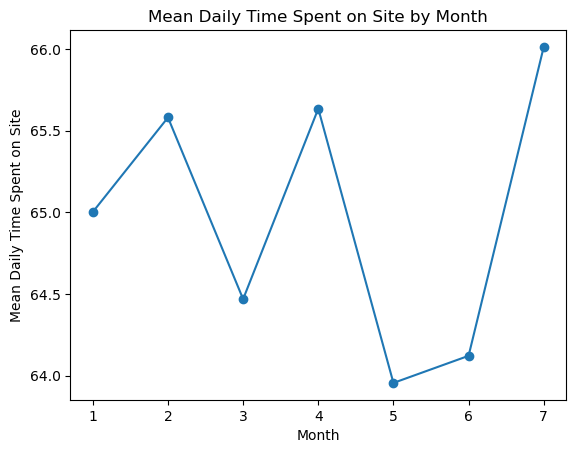

In [32]:
grouped_data1 = df.groupby('month').agg({'Daily Time Spent on Site': 'mean'}).reset_index()

# Plot the data
plt.plot(grouped_data1['month'], grouped_data1['Daily Time Spent on Site'], marker='o')
plt.xlabel('Month')
plt.ylabel('Mean Daily Time Spent on Site')
plt.title('Mean Daily Time Spent on Site by Month')
plt.show()

bulan juli memilki rata rata Daily Time Spent on Site yang paling tinggi dan bulan mei memilki rata rata Daily Time Spent on Site yang paling tinggi

In [33]:
df['city'].value_counts()

city
Surabaya             64
Bandung              64
Jakarta Timur        63
Jakarta Selatan      61
Jakarta Barat        57
Bekasi               56
Medan                48
Jakarta Utara        45
Palembang            42
Semarang             41
Batam                34
Makassar             33
Tangerang Selatan    33
Tangerang            32
Depok                30
Bandar Lampung       29
Bogor                28
Jakarta Pusat        27
Malang               26
Banjarmasin          23
Pakanbaru            23
Denpasar             21
Padang               19
Balikpapan           18
Cimahi               17
Samarinda            16
Tasikmalaya          15
Pontianak            12
Surakarta            12
Serang               11
Name: count, dtype: int64

In [34]:
y= df.groupby('city').agg({'Daily Time Spent on Site':'mean'})

In [35]:
top_10_cities = y.sort_values(by='Daily Time Spent on Site', ascending=False).head(10)
top_10_cities

,Daily Time Spent on Site
city,
Jakarta Pusat,68.968846
Samarinda,68.956000
Balikpapan,68.829444
Jakarta Utara,68.383409
Malang,68.345769
Tangerang,67.971875
Bandar Lampung,67.775517
Jakarta Barat,67.300877
Pontianak,67.244167


kota jakarta pusat memilki rata rata Daily Time Spent on Site yang paling tinggi

In [36]:
i= df.groupby('city').agg({'Daily Internet Usage':'mean'})
i

,Daily Internet Usage
city,
Balikpapan,193.785000
Bandar Lampung,183.303214
Bandung,171.879531
Banjarmasin,164.113043
Batam,181.643529
Bekasi,172.683273
Bogor,178.212143
Cimahi,160.852353
Denpasar,192.737619


In [37]:
top_10_cities1 = i.sort_values(by='Daily Internet Usage', ascending=False).head(10)
top_10_cities1

,Daily Internet Usage
city,
Jakarta Pusat,197.175556
Semarang,196.189250
Malang,193.885769
Balikpapan,193.785000
Denpasar,192.737619
Jakarta Utara,187.825455
Pontianak,187.510833
Palembang,184.065610
Surabaya,184.043125


jakarata pusat adalah kota yang memilki rata rata penggunaan internet terbesar

In [38]:
gt =  df.groupby(['city', 'Clicked on Ad']).size().unstack()
gt

Clicked on Ad,No,Yes
city,,
Balikpapan,13,5
Bandar Lampung,15,14
Bandung,27,37
Banjarmasin,9,14
Batam,17,17
Bekasi,25,31
Bogor,13,15
Cimahi,4,13
Denpasar,12,9


Text(0, 0.5, 'jumlah')

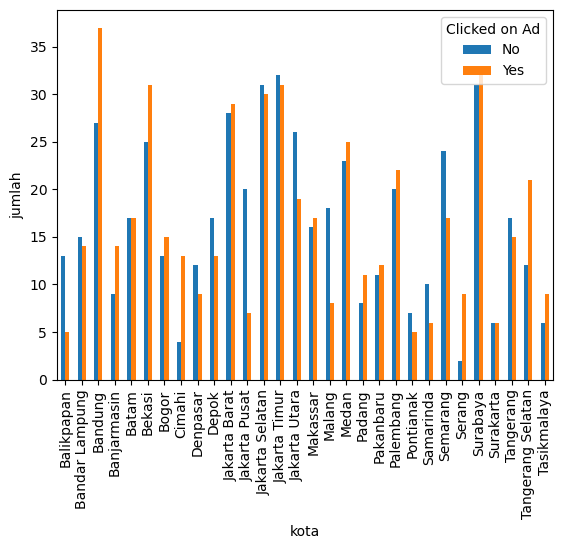

In [39]:
gt =  df.groupby(['city', 'Clicked on Ad']).size().unstack()
gt.plot(kind='bar', stacked=False)
plt.xlabel('kota')
plt.ylabel('jumlah')

kota yang penekan iklan paling banyak adalah bandung, sedangkan kota cimahi memiliki perbandingan besar dimana penekan iklan lebih banyak dari yang tidak menekan iklan

Text(0, 0.5, 'jumlah')

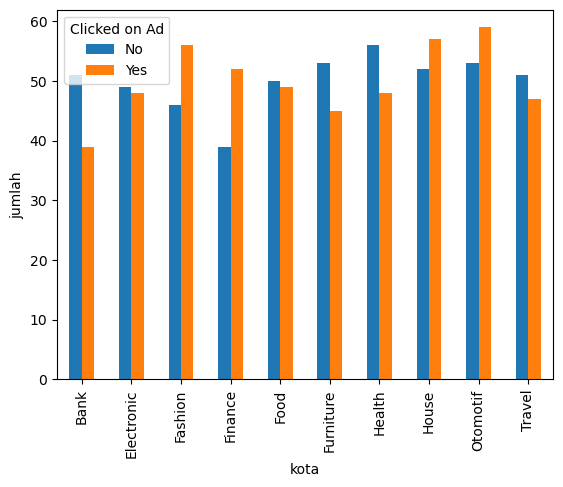

In [40]:
hj =  df.groupby(['category', 'Clicked on Ad']).size().unstack()
hj.plot(kind='bar', stacked=False)
plt.xlabel('kota')
plt.ylabel('jumlah')

otomotif memiliki jumlah penekan iklan yang banyak

C:\Users\PC\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\PC\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\PC\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\PC\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dty

<Axes: xlabel='Age', ylabel='Density'>

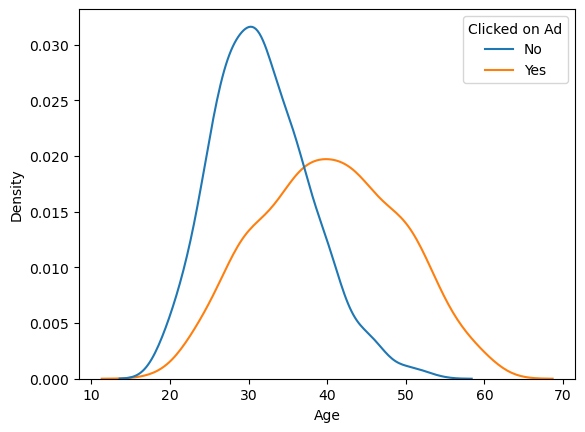

In [41]:
sns.kdeplot(data = df, x = 'Age', hue = 'Clicked on Ad')

C:\Users\PC\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\PC\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\PC\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\PC\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dty

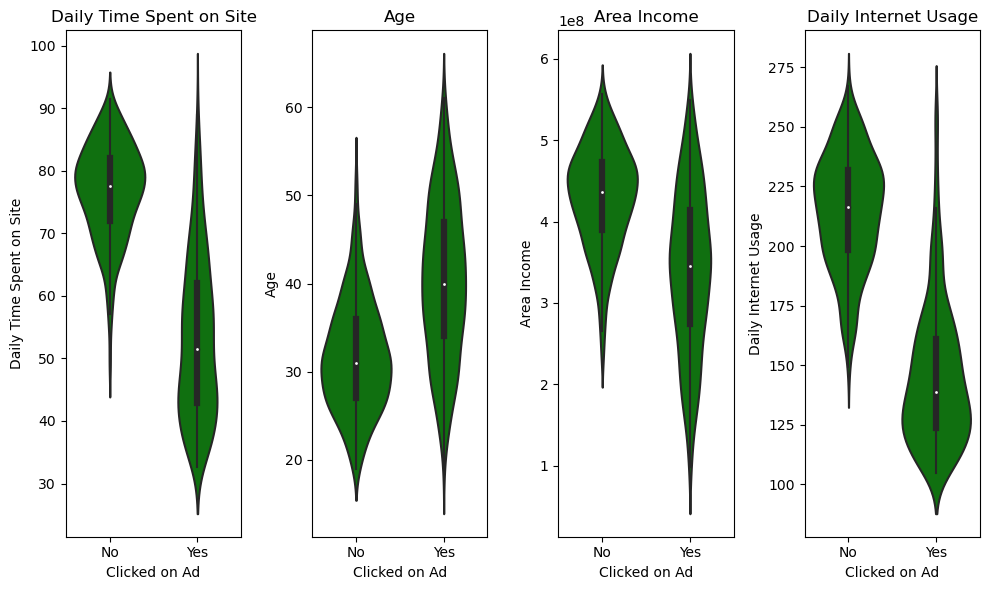

In [42]:
plt.figure(figsize=(10, 6))

# Assuming 'num' is a list of numerical feature column names
features = num

for i in range(len(features)):
    plt.subplot(1, len(features), i+1)
    sns.violinplot(y=df[features[i]], color='green', orient='v', x=df['Clicked on Ad'])
    plt.title(features[i])  # Add a title for each subplot
    plt.tight_layout()

plt.show()

In [43]:
df.pop('month')

0      3
1      4
2      3
3      1
4      6
      ..
995    2
996    4
997    2
998    3
999    6
Name: month, Length: 1000, dtype: int32

In [44]:
df.pop('nama_bulan')

0         Maret
1         April
2         Maret
3       Januari
4          Juni
         ...   
995    Februari
996       April
997    Februari
998       Maret
999        Juni
Name: nama_bulan, Length: 1000, dtype: object

In [45]:
df.head()

,Daily Time Spent on Site,Age,Area Income,Daily Internet Usage,Male,Timestamp,Clicked on Ad,city,province,category,category_age
0,68.95,35,432837300.0,256.09,Perempuan,2016-03-27 00:53:00,No,Jakarta Timur,Daerah Khusus Ibukota Jakarta,Furniture,dewasa
1,80.23,31,479092950.0,193.77,Laki-Laki,2016-04-04 01:39:00,No,Denpasar,Bali,Food,dewasa
2,69.47,26,418501580.0,236.50,Perempuan,2016-03-13 20:35:00,No,Surabaya,Jawa Timur,Electronic,dewasa
3,74.15,29,383643260.0,245.89,Laki-Laki,2016-01-10 02:31:00,No,Batam,Kepulauan Riau,House,dewasa
4,68.37,35,517229930.0,225.58,Perempuan,2016-06-03 03:36:00,No,Medan,Sumatra Utara,Finance,dewasa


C:\Users\PC\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\PC\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\PC\AppData\Local\Temp\ipykernel_9200\537726822.py:5: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
C:\Users\PC\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\PC\AppData\Local\Temp\ipykernel_9200\537726822.py:5: UserWarning: The figure layout has changed t

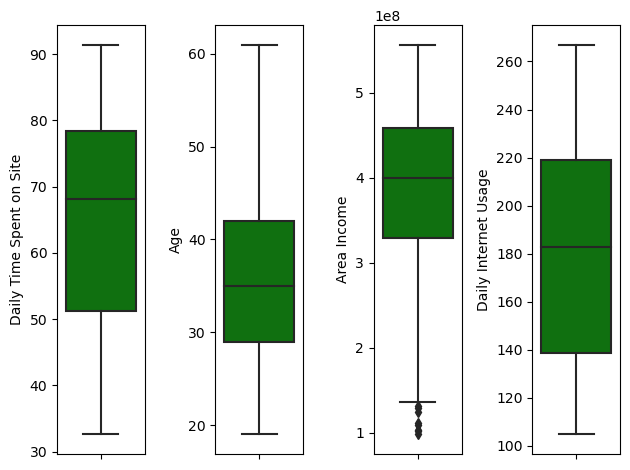

In [46]:
features = num
for i in range(0,len(features)):
    plt.subplot(1,len(features),i+1)
    sns.boxplot(y=df[features[i]],color = 'green',orient = 'v')
    plt.tight_layout()

C:\Users\PC\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\PC\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\PC\AppData\Local\Temp\ipykernel_9200\630699456.py:5: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
C:\Users\PC\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\PC\AppData\Local\Temp\ipykernel_9200\630699456.py:5: UserWarning: The figure layout has changed t

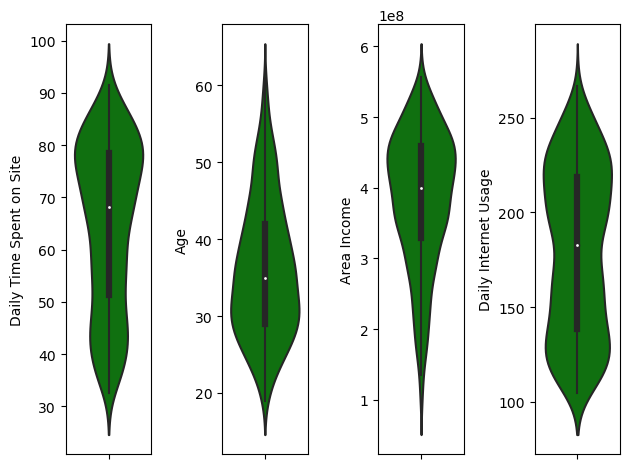

In [47]:
features = num
for i in range(0,len(features)):
    plt.subplot(1,len(features),i+1)
    sns.violinplot(y=df[features[i]],color = 'green',orient = 'v')
    plt.tight_layout()

C:\Users\PC\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\PC\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\PC\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\PC\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dty

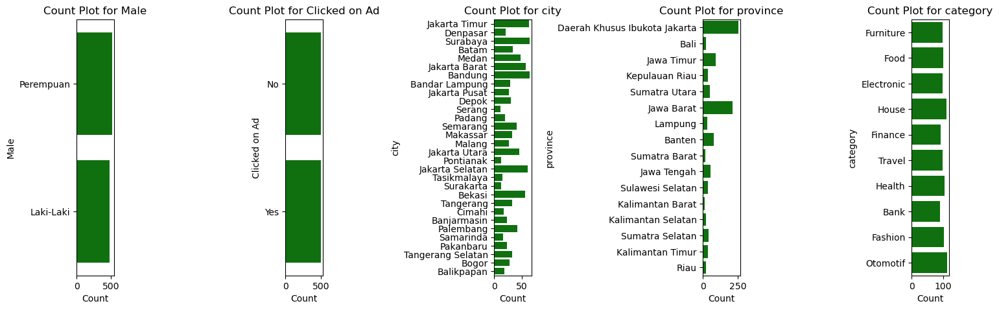

In [48]:
cat_features  = cat
plt.figure(figsize=(15, 5))

# Membuat subplot untuk setiap fitur kategorikal
for i, feature in enumerate(cat_features, 1):
    plt.subplot(1, len(cat_features), i)
    sns.countplot(y=df[feature], color='green', orient='h')
    plt.title(f'Count Plot for {feature}')
    plt.xlabel('Count')
    plt.ylabel(feature)
    plt.tight_layout(pad=1.5)  # Memberikan ruang di antara subplot

# Menampilkan plot
plt.show()

C:\Users\PC\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\PC\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\PC\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\PC\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dty

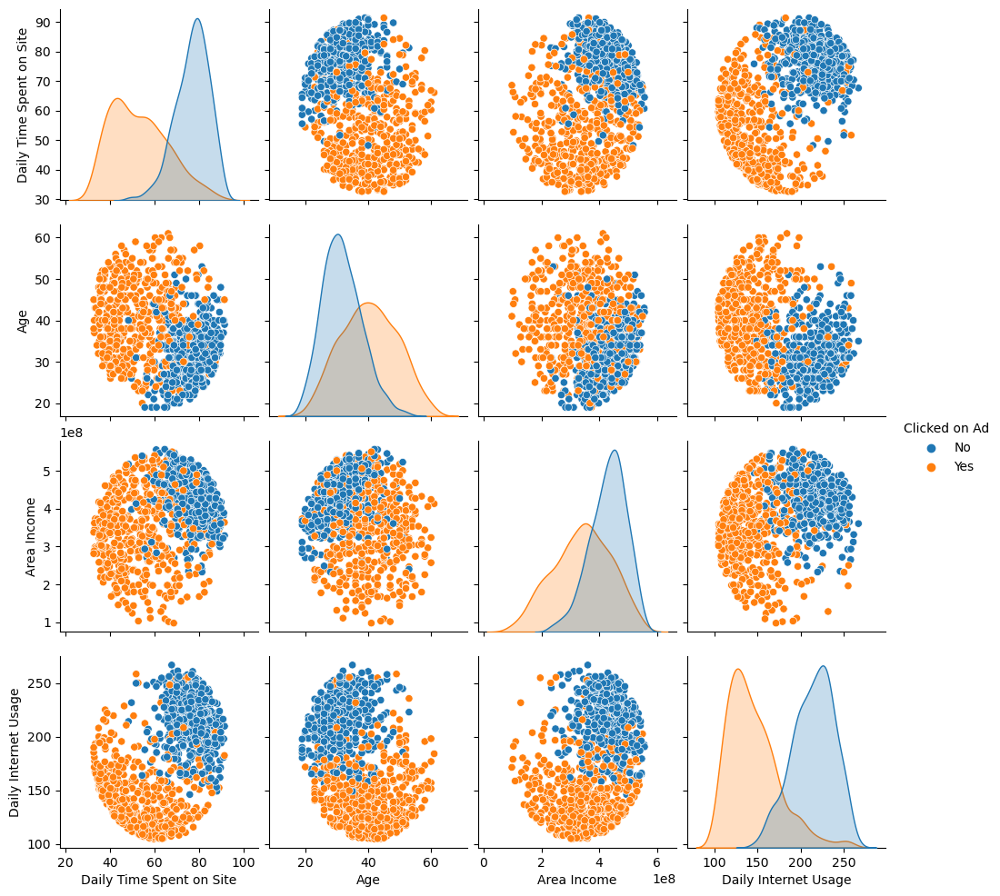

In [49]:
sns.pairplot(df, diag_kind ='kde',hue = 'Clicked on Ad')

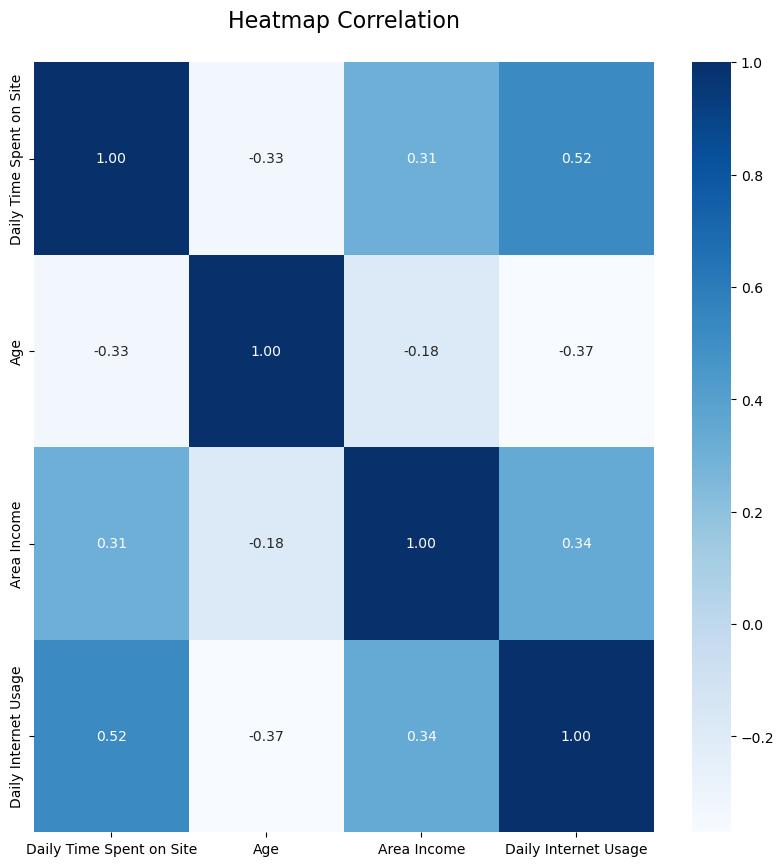

In [50]:
plt.figure(figsize=(10, 10))
sns.heatmap(df[num].corr(), cmap='Blues', annot=True, fmt='.2f')
plt.title('Heatmap Correlation\n', fontsize=16)
plt.show()

terdapat korelasi yang cukup tinggi antara kolom Daily Time Spent on Site dan Daily Internet Usage

In [51]:
df.pop('category_age')


0      dewasa
1      dewasa
2      dewasa
3      dewasa
4      dewasa
        ...  
995    dewasa
996    dewasa
997    lansia
998    remaja
999    dewasa
Name: category_age, Length: 1000, dtype: object

In [52]:

df.pop('province')

0      Daerah Khusus Ibukota Jakarta
1                               Bali
2                         Jawa Timur
3                     Kepulauan Riau
4                      Sumatra Utara
                   ...              
995                      Jawa Tengah
996                             Riau
997                 Kalimantan Timur
998                           Banten
999                           Banten
Name: province, Length: 1000, dtype: object

# Data  Prepocessing

In [53]:
#melihat kolom yang memiliki nilai yang kosong 
df.isna().sum()

Daily Time Spent on Site    13
Age                          0
Area Income                 13
Daily Internet Usage        11
Male                         3
Timestamp                    0
Clicked on Ad                0
city                         0
category                     0
dtype: int64

In [54]:
#mengisi nilai yang kosong 
df['Daily Internet Usage'] = df['Daily Internet Usage'].fillna(df['Daily Internet Usage'].median())
df['Male'] = df['Male'].fillna(df['Male'].mode()[0])
df['Area Income'] = df['Area Income'].fillna(df['Area Income'].median())
df['Daily Time Spent on Site'] = df['Daily Time Spent on Site'].fillna(df['Daily Time Spent on Site'].median())

In [55]:
#cek kolom yang kosong
df.isna().sum()

Daily Time Spent on Site    0
Age                         0
Area Income                 0
Daily Internet Usage        0
Male                        0
Timestamp                   0
Clicked on Ad               0
city                        0
category                    0
dtype: int64

In [56]:
#mengecek nilai yang duplikat
df.duplicated().sum()

0

In [57]:
df.head()

,Daily Time Spent on Site,Age,Area Income,Daily Internet Usage,Male,Timestamp,Clicked on Ad,city,category
0,68.95,35,432837300.0,256.09,Perempuan,2016-03-27 00:53:00,No,Jakarta Timur,Furniture
1,80.23,31,479092950.0,193.77,Laki-Laki,2016-04-04 01:39:00,No,Denpasar,Food
2,69.47,26,418501580.0,236.50,Perempuan,2016-03-13 20:35:00,No,Surabaya,Electronic
3,74.15,29,383643260.0,245.89,Laki-Laki,2016-01-10 02:31:00,No,Batam,House
4,68.37,35,517229930.0,225.58,Perempuan,2016-06-03 03:36:00,No,Medan,Finance


In [58]:
df['week'] = df['Timestamp'].dt.isocalendar().week


In [59]:
df.head()

,Daily Time Spent on Site,Age,Area Income,Daily Internet Usage,Male,Timestamp,Clicked on Ad,city,category,week
0,68.95,35,432837300.0,256.09,Perempuan,2016-03-27 00:53:00,No,Jakarta Timur,Furniture,12
1,80.23,31,479092950.0,193.77,Laki-Laki,2016-04-04 01:39:00,No,Denpasar,Food,14
2,69.47,26,418501580.0,236.50,Perempuan,2016-03-13 20:35:00,No,Surabaya,Electronic,10
3,74.15,29,383643260.0,245.89,Laki-Laki,2016-01-10 02:31:00,No,Batam,House,1
4,68.37,35,517229930.0,225.58,Perempuan,2016-06-03 03:36:00,No,Medan,Finance,22


In [60]:
#menghapus outlier
q1 = df['Area Income'].quantile(0.25)
q3 = df['Area Income'].quantile(0.75)

iqr = q3 - q1

lower = q1 - 1.5 * iqr
upper = q3 + 1.5 * iqr

data = df[(df['Area Income'] >= lower) & (df['Area Income'] <= upper)]

print("Data asli:")
print(df)
print("\nData tanpa outlier:")
print(data)

Data asli:
     Daily Time Spent on Site  Age  Area Income  Daily Internet Usage  \
0                       68.95   35  432837300.0                256.09   
1                       80.23   31  479092950.0                193.77   
2                       69.47   26  418501580.0                236.50   
3                       74.15   29  383643260.0                245.89   
4                       68.37   35  517229930.0                225.58   
..                        ...  ...          ...                   ...   
995                     72.97   30  499691990.0                208.58   
996                     51.30   45  474475190.0                134.42   
997                     68.11   51  296910040.0                120.37   
998                     55.55   19  293445530.0                187.95   
999                     45.01   26  209130600.0                178.35   

          Male           Timestamp Clicked on Ad           city    category  \
0    Perempuan 2016-03-27 00:53:0

In [61]:
data

,Daily Time Spent on Site,Age,Area Income,Daily Internet Usage,Male,Timestamp,Clicked on Ad,city,category,week
0,68.95,35,432837300.0,256.09,Perempuan,2016-03-27 00:53:00,No,Jakarta Timur,Furniture,12
1,80.23,31,479092950.0,193.77,Laki-Laki,2016-04-04 01:39:00,No,Denpasar,Food,14
2,69.47,26,418501580.0,236.50,Perempuan,2016-03-13 20:35:00,No,Surabaya,Electronic,10
3,74.15,29,383643260.0,245.89,Laki-Laki,2016-01-10 02:31:00,No,Batam,House,1
4,68.37,35,517229930.0,225.58,Perempuan,2016-06-03 03:36:00,No,Medan,Finance,22
...,...,...,...,...,...,...,...,...,...,...
995,72.97,30,499691990.0,208.58,Laki-Laki,2016-02-11 21:49:00,Yes,Semarang,Finance,6
996,51.30,45,474475190.0,134.42,Laki-Laki,2016-04-22 02:07:00,Yes,Pakanbaru,Electronic,16
997,68.11,51,296910040.0,120.37,Laki-Laki,2016-02-01 17:24:00,Yes,Samarinda,Travel,5
998,55.55,19,293445530.0,187.95,Perempuan,2016-03-24 02:35:00,No,Tangerang,Bank,12


In [62]:
data.pop('Timestamp')

0     2016-03-27 00:53:00
1     2016-04-04 01:39:00
2     2016-03-13 20:35:00
3     2016-01-10 02:31:00
4     2016-06-03 03:36:00
              ...        
995   2016-02-11 21:49:00
996   2016-04-22 02:07:00
997   2016-02-01 17:24:00
998   2016-03-24 02:35:00
999   2016-06-03 21:43:00
Name: Timestamp, Length: 991, dtype: datetime64[ns]

In [63]:
data

,Daily Time Spent on Site,Age,Area Income,Daily Internet Usage,Male,Clicked on Ad,city,category,week
0,68.95,35,432837300.0,256.09,Perempuan,No,Jakarta Timur,Furniture,12
1,80.23,31,479092950.0,193.77,Laki-Laki,No,Denpasar,Food,14
2,69.47,26,418501580.0,236.50,Perempuan,No,Surabaya,Electronic,10
3,74.15,29,383643260.0,245.89,Laki-Laki,No,Batam,House,1
4,68.37,35,517229930.0,225.58,Perempuan,No,Medan,Finance,22
...,...,...,...,...,...,...,...,...,...
995,72.97,30,499691990.0,208.58,Laki-Laki,Yes,Semarang,Finance,6
996,51.30,45,474475190.0,134.42,Laki-Laki,Yes,Pakanbaru,Electronic,16
997,68.11,51,296910040.0,120.37,Laki-Laki,Yes,Samarinda,Travel,5
998,55.55,19,293445530.0,187.95,Perempuan,No,Tangerang,Bank,12


In [64]:
df['Daily Time Spent on Site']

0      68.95
1      80.23
2      69.47
3      74.15
4      68.37
       ...  
995    72.97
996    51.30
997    68.11
998    55.55
999    45.01
Name: Daily Time Spent on Site, Length: 1000, dtype: float64

In [65]:
train = data.copy()

In [66]:
train

,Daily Time Spent on Site,Age,Area Income,Daily Internet Usage,Male,Clicked on Ad,city,category,week
0,68.95,35,432837300.0,256.09,Perempuan,No,Jakarta Timur,Furniture,12
1,80.23,31,479092950.0,193.77,Laki-Laki,No,Denpasar,Food,14
2,69.47,26,418501580.0,236.50,Perempuan,No,Surabaya,Electronic,10
3,74.15,29,383643260.0,245.89,Laki-Laki,No,Batam,House,1
4,68.37,35,517229930.0,225.58,Perempuan,No,Medan,Finance,22
...,...,...,...,...,...,...,...,...,...
995,72.97,30,499691990.0,208.58,Laki-Laki,Yes,Semarang,Finance,6
996,51.30,45,474475190.0,134.42,Laki-Laki,Yes,Pakanbaru,Electronic,16
997,68.11,51,296910040.0,120.37,Laki-Laki,Yes,Samarinda,Travel,5
998,55.55,19,293445530.0,187.95,Perempuan,No,Tangerang,Bank,12


In [67]:

r = pd.get_dummies(train['Male'])
t = pd.get_dummies(train['city'])
y = pd.get_dummies(train['category'])


In [68]:
train = pd.concat([train, r, t, y], axis=1)

# Menghapus kolom 'Male', 'city', dan 'category' yang sudah di-one-hot encoding
train = train.drop(['Male', 'city', 'category'], axis=1)

# Menampilkan DataFrame train yang sudah di-update
print(train)

     Daily Time Spent on Site  Age  Area Income  Daily Internet Usage  \
0                       68.95   35  432837300.0                256.09   
1                       80.23   31  479092950.0                193.77   
2                       69.47   26  418501580.0                236.50   
3                       74.15   29  383643260.0                245.89   
4                       68.37   35  517229930.0                225.58   
..                        ...  ...          ...                   ...   
995                     72.97   30  499691990.0                208.58   
996                     51.30   45  474475190.0                134.42   
997                     68.11   51  296910040.0                120.37   
998                     55.55   19  293445530.0                187.95   
999                     45.01   26  209130600.0                178.35   

    Clicked on Ad  week  Laki-Laki  Perempuan  Balikpapan  Bandar Lampung  \
0              No    12      False       True 

In [69]:
train

,Daily Time Spent on Site,Age,Area Income,Daily Internet Usage,Clicked on Ad,week,Laki-Laki,Perempuan,Balikpapan,Bandar Lampung,...,Bank,Electronic,Fashion,Finance,Food,Furniture,Health,House,Otomotif,Travel
0,68.95,35,432837300.0,256.09,No,12,False,True,False,False,...,False,False,False,False,False,True,False,False,False,False
1,80.23,31,479092950.0,193.77,No,14,True,False,False,False,...,False,False,False,False,True,False,False,False,False,False
2,69.47,26,418501580.0,236.50,No,10,False,True,False,False,...,False,True,False,False,False,False,False,False,False,False
3,74.15,29,383643260.0,245.89,No,1,True,False,False,False,...,False,False,False,False,False,False,False,True,False,False
4,68.37,35,517229930.0,225.58,No,22,False,True,False,False,...,False,False,False,True,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,72.97,30,499691990.0,208.58,Yes,6,True,False,False,False,...,False,False,False,True,False,False,False,False,False,False
996,51.30,45,474475190.0,134.42,Yes,16,True,False,False,False,...,False,True,False,False,False,False,False,False,False,False
997,68.11,51,296910040.0,120.37,Yes,5,True,False,False,False,...,False,False,False,False,False,False,False,False,False,True
998,55.55,19,293445530.0,187.95,No,12,False,True,False,False,...,True,False,False,False,False,False,False,False,False,False


In [70]:
train['Clicked on Ad'].replace({'Yes': 1, 'No': 0}, inplace=True)


In [71]:
train 

,Daily Time Spent on Site,Age,Area Income,Daily Internet Usage,Clicked on Ad,week,Laki-Laki,Perempuan,Balikpapan,Bandar Lampung,...,Bank,Electronic,Fashion,Finance,Food,Furniture,Health,House,Otomotif,Travel
0,68.95,35,432837300.0,256.09,0,12,False,True,False,False,...,False,False,False,False,False,True,False,False,False,False
1,80.23,31,479092950.0,193.77,0,14,True,False,False,False,...,False,False,False,False,True,False,False,False,False,False
2,69.47,26,418501580.0,236.50,0,10,False,True,False,False,...,False,True,False,False,False,False,False,False,False,False
3,74.15,29,383643260.0,245.89,0,1,True,False,False,False,...,False,False,False,False,False,False,False,True,False,False
4,68.37,35,517229930.0,225.58,0,22,False,True,False,False,...,False,False,False,True,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,72.97,30,499691990.0,208.58,1,6,True,False,False,False,...,False,False,False,True,False,False,False,False,False,False
996,51.30,45,474475190.0,134.42,1,16,True,False,False,False,...,False,True,False,False,False,False,False,False,False,False
997,68.11,51,296910040.0,120.37,1,5,True,False,False,False,...,False,False,False,False,False,False,False,False,False,True
998,55.55,19,293445530.0,187.95,0,12,False,True,False,False,...,True,False,False,False,False,False,False,False,False,False


In [72]:
bool_columns = train.select_dtypes(include='bool').columns
train[bool_columns] = train[bool_columns].astype(int)

In [73]:
train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 991 entries, 0 to 999
Data columns (total 48 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Daily Time Spent on Site  991 non-null    float64
 1   Age                       991 non-null    int64  
 2   Area Income               991 non-null    float64
 3   Daily Internet Usage      991 non-null    float64
 4   Clicked on Ad             991 non-null    int64  
 5   week                      991 non-null    UInt32 
 6   Laki-Laki                 991 non-null    int32  
 7   Perempuan                 991 non-null    int32  
 8   Balikpapan                991 non-null    int32  
 9   Bandar Lampung            991 non-null    int32  
 10  Bandung                   991 non-null    int32  
 11  Banjarmasin               991 non-null    int32  
 12  Batam                     991 non-null    int32  
 13  Bekasi                    991 non-null    int32  
 14  Bogor          

In [74]:
# split data 
x_data = train.drop(columns =['Clicked on Ad'])
y_data = train['Clicked on Ad']

In [75]:
x_data.isna().sum()

Daily Time Spent on Site    0
Age                         0
Area Income                 0
Daily Internet Usage        0
week                        0
Laki-Laki                   0
Perempuan                   0
Balikpapan                  0
Bandar Lampung              0
Bandung                     0
Banjarmasin                 0
Batam                       0
Bekasi                      0
Bogor                       0
Cimahi                      0
Denpasar                    0
Depok                       0
Jakarta Barat               0
Jakarta Pusat               0
Jakarta Selatan             0
Jakarta Timur               0
Jakarta Utara               0
Makassar                    0
Malang                      0
Medan                       0
Padang                      0
Pakanbaru                   0
Palembang                   0
Pontianak                   0
Samarinda                   0
Semarang                    0
Serang                      0
Surabaya                    0
Surakarta 

In [76]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(x_data, y_data ,test_size = 0.2, shuffle=False)

In [77]:
print(X_train.shape, X_test.shape, y_train.shape, y_test.shape)

(792, 47) (199, 47) (792,) (199,)


In [78]:
print(X_train)


     Daily Time Spent on Site  Age  Area Income  Daily Internet Usage  week  \
0                       68.95   35  432837300.0                256.09    12   
1                       80.23   31  479092950.0                193.77    14   
2                       69.47   26  418501580.0                236.50    10   
3                       74.15   29  383643260.0                245.89     1   
4                       68.37   35  517229930.0                225.58    22   
..                        ...  ...          ...                   ...   ...   
795                     75.64   29  488027330.0                204.82    11   
796                     79.22   27  444004260.0                198.79    10   
797                     77.05   34  460294520.0                236.08    20   
798                     66.83   46  545102250.0                196.17     8   
799                     76.20   24  330810130.0                228.81     9   

     Laki-Laki  Perempuan  Balikpapan  Bandar Lampu

In [79]:
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.model_selection import cross_validate
from sklearn.model_selection import RandomizedSearchCV, GridSearchCV
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix
from sklearn.pipeline import Pipeline
import time
def eval_classification1(model, X_test, y_test, X_train, y_train):
    y_pred = model.predict(X_test)
    y_pred_train = model.predict(X_train)
    y_pred_proba = model.predict_proba(X_test)
    y_pred_proba_train = model.predict_proba(X_train)

    print("Accuracy (Test Set): %.2f" % accuracy_score(y_test, y_pred))
    print("Accuracy (Train Set): %.2f" % accuracy_score(y_train, y_pred_train))
    print("Precision (Test Set): %.2f" % precision_score(y_test, y_pred, zero_division=0))
    print("Recall (Test Set): %.2f" % recall_score(y_test, y_pred))
    print("Recall (Train Set): %.2f" % recall_score(y_train, y_pred_train))
    print("F1-Score (Test Set): %.2f" % f1_score(y_test, y_pred))

    print("roc_auc (test-proba): %.2f" % roc_auc_score(y_test, y_pred_proba[:, 1]))
    print("roc_auc (train-proba): %.2f" % roc_auc_score(y_train, y_pred_proba_train[:, 1]))

    cv = RepeatedStratifiedKFold(random_state=42, n_repeats = 3)
    score = cross_validate(model, X=X_train, y=y_train, cv=cv, scoring='accuracy', return_train_score=True)
    print('Accuracy (crossval train): '+ str(score['train_score'].mean()))
    print('Accuracy (crossval test): '+ str(score['test_score'].mean()))


def grid_pipe1(pipedict, hyperdict, scoring='accuracy', display=True):
    fitted_models1={}
    fit_time1 = []
    for name, pipeline in pipedict.items():
    # Construct grid search
        cv = RepeatedStratifiedKFold(random_state=42, n_repeats = 3)
        model = GridSearchCV(estimator=pipeline,
                             param_grid=hyperdict[name],
                             scoring=scoring,
                             cv=cv, verbose=2, n_jobs=-1, return_train_score = True, error_score='raise')

        # Fit using grid search
        start = time.time()
        model.fit(X_train, y_train)
        end = time.time()
        fit_time1.append(round(end-start, 2))
        #Append model
        fitted_models1[name]=model
        if display:
            #Print when the model has been fitted
            print(f'The {name} model has been fitted.')
            # print fit time
            print('Total Fit Time: %.3fs' % (end-start))
            # Best accuracy
            print('Best accuracy: %.3f' % model.best_score_)
            # Best params
            print('Best params:\n', model.best_params_,'\n')

    return fitted_models1, fit_time1

def confusion1(model):
    y_pred_proba = model.predict_proba(X_test)
    y_predict = model.predict(X_test)
    print('Accuracy: %.2f%%' % (accuracy_score(y_test, y_predict) * 100 ))
    print('Precision: %.2f%%' % (precision_score(y_test, y_predict, zero_division=0) * 100))
    print('Recall: %.2f%%' % (recall_score(y_test, y_predict) * 100))
    print('F1_Score: %.2f%%' % (f1_score(y_test, y_predict) * 100))
    print('ROC_AUC: %.2f%%' % (roc_auc_score(y_test, y_pred_proba[:,1]) * 100))
    confusion_matrix_model = confusion_matrix(y_test, y_predict)
    plt.figure(figsize=(12,8))
    ax = plt.subplot()
    sns.heatmap(confusion_matrix_model, annot=True, fmt='g', ax = ax)
    ax.set_xlabel('Predicted Label')
    ax.set_ylabel('Actual Label')
    ax.set_title(f'Confusion Matrix - {model}')
    ax.xaxis.set_ticklabels(['0','1'])
    ax.yaxis.set_ticklabels(['0','1'])

# logisticregression

In [80]:
from sklearn.linear_model import LogisticRegression

logreg1 = LogisticRegression(random_state=123)
logreg1.fit(X_train, y_train)

eval_classification1(logreg1, X_test, y_test, X_train, y_train)

Accuracy (Test Set): 0.44
Accuracy (Train Set): 0.52
Precision (Test Set): 0.00
Recall (Test Set): 0.00
Recall (Train Set): 0.00
F1-Score (Test Set): 0.00
roc_auc (test-proba): 0.76
roc_auc (train-proba): 0.76
Accuracy (crossval train): 0.5202017332715376
Accuracy (crossval test): 0.5201974365098321


Accuracy: 44.22%
Precision: 0.00%
Recall: 0.00%
F1_Score: 0.00%
ROC_AUC: 76.48%


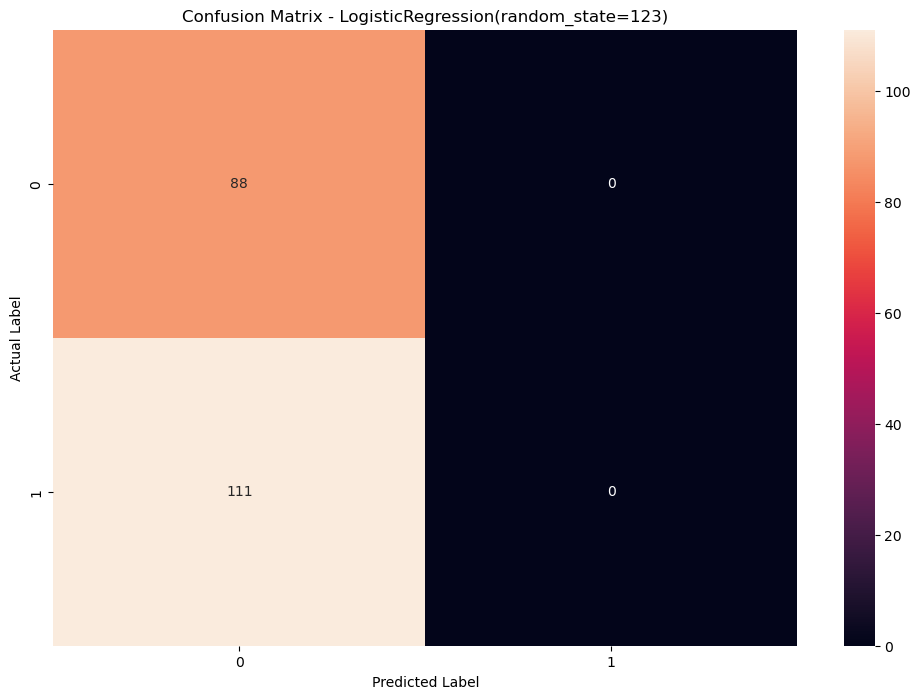

In [81]:
confusion1(logreg1)

In [82]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.fit_transform(X_test)
eval_classification1(logreg1, X_test_scaled, y_test,X_train_scaled, y_train)

Accuracy (Test Set): 0.72
Accuracy (Train Set): 0.70
Precision (Test Set): 0.79
Recall (Test Set): 0.68
Recall (Train Set): 0.63
F1-Score (Test Set): 0.73
roc_auc (test-proba): 0.76
roc_auc (train-proba): 0.76
Accuracy (crossval train): 0.9821131161511203
Accuracy (crossval test): 0.9617068704720964


C:\Users\PC\anaconda3\Lib\site-packages\sklearn\base.py:465: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(
C:\Users\PC\anaconda3\Lib\site-packages\sklearn\base.py:465: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(
C:\Users\PC\anaconda3\Lib\site-packages\sklearn\base.py:465: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(
C:\Users\PC\anaconda3\Lib\site-packages\sklearn\base.py:465: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(


In [83]:
from sklearn.model_selection import GridSearchCV

# Define the logistic regression model with hyperparameters to tune
logreg = LogisticRegression(random_state=123)
params = {'C': [0.01, 0.1, 1, 10, 100], 'solver': ['lbfgs', 'saga']}

# Perform grid search with cross-validation
grid_search = GridSearchCV(logreg, params, cv=5, scoring='accuracy')
grid_search.fit(X_train, y_train)

# Print the best hyperparameters and evaluation score
print('Best hyperparameters:', grid_search.best_params_)
print('Best evaluation score:', grid_search.best_score_)

# Train the logistic regression model with the best hyperparameters
logreg_best = grid_search.best_estimator_
logreg_best.fit(X_train, y_train)

# Evaluate the model on the test set
eval_classification1(logreg_best, X_test, y_test, X_train, y_train)

Best hyperparameters: {'C': 0.01, 'solver': 'lbfgs'}
Best evaluation score: 0.5201974365098321
Accuracy (Test Set): 0.44
Accuracy (Train Set): 0.52
Precision (Test Set): 0.00
Recall (Test Set): 0.00
Recall (Train Set): 0.00
F1-Score (Test Set): 0.00
roc_auc (test-proba): 0.76
roc_auc (train-proba): 0.76
Accuracy (crossval train): 0.5202017332715376
Accuracy (crossval test): 0.5201974365098321


# KNN

In [84]:
from sklearn.neighbors import KNeighborsClassifier

knn1 = KNeighborsClassifier()
knn1.fit(X_train, y_train)

eval_classification1(knn1, X_test, y_test, X_train, y_train)

Accuracy (Test Set): 0.60
Accuracy (Train Set): 0.77
Precision (Test Set): 0.66
Recall (Test Set): 0.60
Recall (Train Set): 0.71
F1-Score (Test Set): 0.63
roc_auc (test-proba): 0.65
roc_auc (train-proba): 0.85
Accuracy (crossval train): 0.7654689584257361
Accuracy (crossval test): 0.6607886845527161


Accuracy: 60.30%
Precision: 65.69%
Recall: 60.36%
F1_Score: 62.91%
ROC_AUC: 64.57%


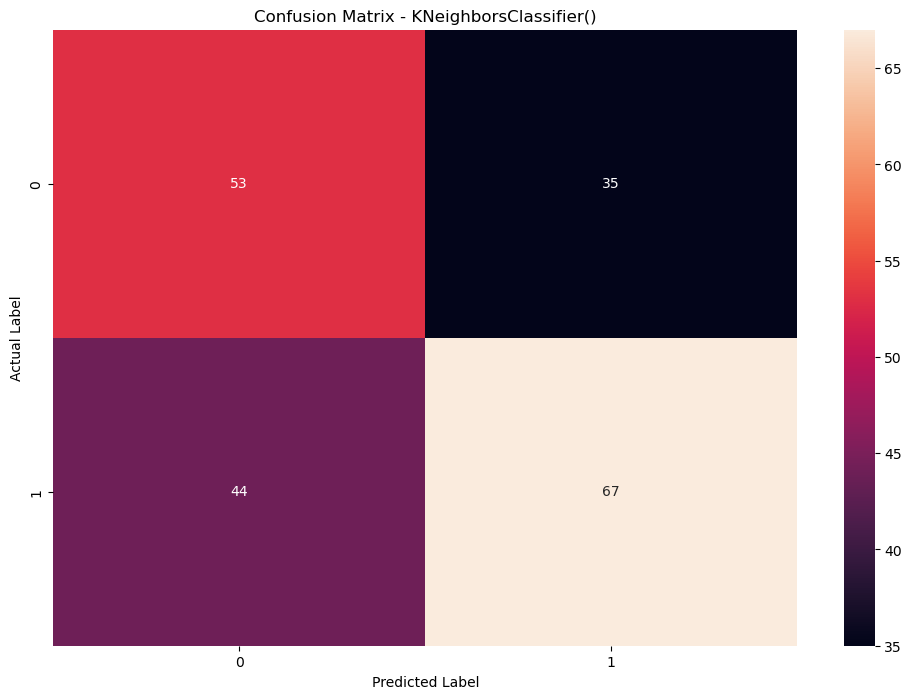

In [85]:
confusion1(knn1)

In [86]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.fit_transform(X_test)
eval_classification1(knn1, X_test_scaled, y_test,X_train_scaled, y_train)

C:\Users\PC\anaconda3\Lib\site-packages\sklearn\base.py:465: UserWarning: X does not have valid feature names, but KNeighborsClassifier was fitted with feature names
  warnings.warn(
C:\Users\PC\anaconda3\Lib\site-packages\sklearn\base.py:465: UserWarning: X does not have valid feature names, but KNeighborsClassifier was fitted with feature names
  warnings.warn(
C:\Users\PC\anaconda3\Lib\site-packages\sklearn\base.py:465: UserWarning: X does not have valid feature names, but KNeighborsClassifier was fitted with feature names
  warnings.warn(
C:\Users\PC\anaconda3\Lib\site-packages\sklearn\base.py:465: UserWarning: X does not have valid feature names, but KNeighborsClassifier was fitted with feature names
  warnings.warn(


Accuracy (Test Set): 0.56
Accuracy (Train Set): 0.48
Precision (Test Set): 0.56
Recall (Test Set): 1.00
Recall (Train Set): 1.00
F1-Score (Test Set): 0.72
roc_auc (test-proba): 0.50
roc_auc (train-proba): 0.50
Accuracy (crossval train): 0.866897570197165
Accuracy (crossval test): 0.7887243584640289


In [87]:
from sklearn.model_selection import GridSearchCV

# Define the KNN classifier with a hyperparameter to tune
knn = KNeighborsClassifier()
params = {'n_neighbors': range(1, 11)}

# Perform grid search with cross-validation
grid_search = GridSearchCV(knn, params, cv=5, scoring='accuracy')
grid_search.fit(X_train, y_train)

# Print the best hyperparameters and evaluation score
print('Best hyperparameters:', grid_search.best_params_)
print('Best evaluation score:', grid_search.best_score_)

# Train the KNN classifier with the best hyperparameters
knn_best = grid_search.best_estimator_
knn_best.fit(X_train, y_train)

# Evaluate the model on the test set
eval_classification1(knn_best, X_test, y_test, X_train, y_train)

Best hyperparameters: {'n_neighbors': 8}
Best evaluation score: 0.6918955497173792
Accuracy (Test Set): 0.65
Accuracy (Train Set): 0.74
Precision (Test Set): 0.77
Recall (Test Set): 0.54
Recall (Train Set): 0.58
F1-Score (Test Set): 0.63
roc_auc (test-proba): 0.69
roc_auc (train-proba): 0.84
Accuracy (crossval train): 0.7422161423163113
Accuracy (crossval test): 0.6830905182708383


# DecisionTree

In [88]:
from sklearn.tree import DecisionTreeClassifier

dt1 = DecisionTreeClassifier()
dt1.fit(X_train, y_train)

eval_classification1(dt1, X_test, y_test, X_train, y_train)

Accuracy (Test Set): 0.94
Accuracy (Train Set): 1.00
Precision (Test Set): 0.97
Recall (Test Set): 0.93
Recall (Train Set): 1.00
F1-Score (Test Set): 0.95
roc_auc (test-proba): 0.95
roc_auc (train-proba): 1.00
Accuracy (crossval train): 1.0
Accuracy (crossval test): 0.9453015948836346


Accuracy: 94.47%
Precision: 97.17%
Recall: 92.79%
F1_Score: 94.93%
ROC_AUC: 94.69%


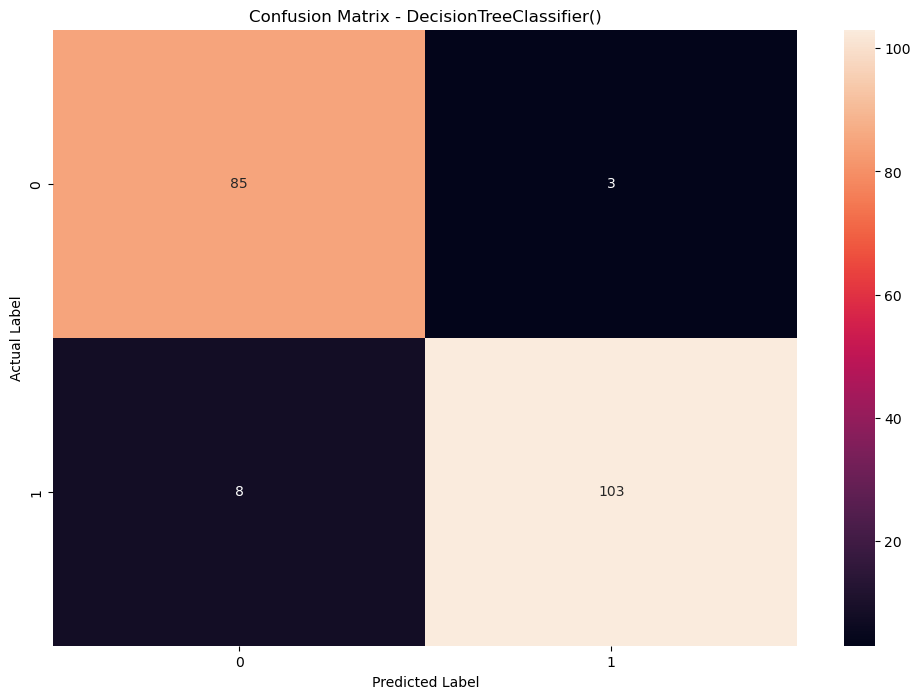

In [89]:
confusion1(dt1)

In [90]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.fit_transform(X_test)
eval_classification1(dt1, X_test_scaled, y_test,X_train_scaled, y_train)

Accuracy (Test Set): 0.56
Accuracy (Train Set): 0.48
Precision (Test Set): 0.56
Recall (Test Set): 1.00
Recall (Train Set): 1.00
F1-Score (Test Set): 0.72
roc_auc (test-proba): 0.50
roc_auc (train-proba): 0.50
Accuracy (crossval train): 1.0
Accuracy (crossval test): 0.9436111774540243


C:\Users\PC\anaconda3\Lib\site-packages\sklearn\base.py:465: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(
C:\Users\PC\anaconda3\Lib\site-packages\sklearn\base.py:465: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(
C:\Users\PC\anaconda3\Lib\site-packages\sklearn\base.py:465: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(
C:\Users\PC\anaconda3\Lib\site-packages\sklearn\base.py:465: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(


In [91]:
from sklearn.model_selection import GridSearchCV

# Define the decision tree classifier with a hyperparameter to tune
dt = DecisionTreeClassifier()
params = {'max_depth': [None, 10, 20, 30, 40, 50]}

# Perform grid search with cross-validation
grid_search = GridSearchCV(dt, params, cv=5, scoring='accuracy')
grid_search.fit(X_train, y_train)

# Print the best hyperparameters and evaluation score
print('Best hyperparameters:', grid_search.best_params_)
print('Best evaluation score:', grid_search.best_score_)

# Train the decision tree classifier with the best hyperparameters
dt_best = grid_search.best_estimator_
dt_best.fit(X_train, y_train)

# Evaluate the model on the test set
eval_classification1(dt_best, X_test, y_test, X_train, y_train)

Best hyperparameters: {'max_depth': None}
Best evaluation score: 0.9431812753761643
Accuracy (Test Set): 0.93
Accuracy (Train Set): 1.00
Precision (Test Set): 0.95
Recall (Test Set): 0.93
Recall (Train Set): 1.00
F1-Score (Test Set): 0.94
roc_auc (test-proba): 0.94
roc_auc (train-proba): 1.00
Accuracy (crossval train): 1.0
Accuracy (crossval test): 0.9440357720988247


Accuracy: 93.47%
Precision: 95.37%
Recall: 92.79%
F1_Score: 94.06%
ROC_AUC: 93.56%


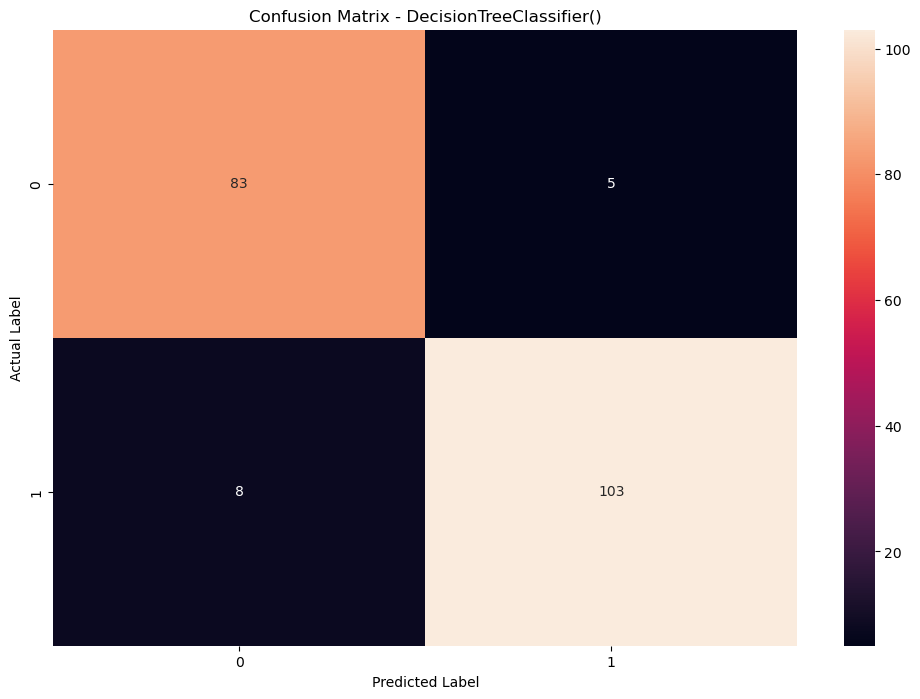

In [93]:
confusion1(dt_best)

# model lgbm

In [94]:
from lightgbm import LGBMClassifier
lgbm_model = LGBMClassifier()
lgbm_model.fit(X_train, y_train)
eval_classification1(lgbm_model, X_test, y_test, X_train, y_train)

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 380, number of negative: 412
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000093 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 902
[LightGBM] [Info] Number of data points in the train set: 792, number of used features: 37
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.479798 -> initscore=-0.080852
[LightGBM] [Info] Start training from score -0.080852
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

Accuracy: 94.97%
Precision: 97.20%
Recall: 93.69%
F1_Score: 95.41%
ROC_AUC: 98.75%


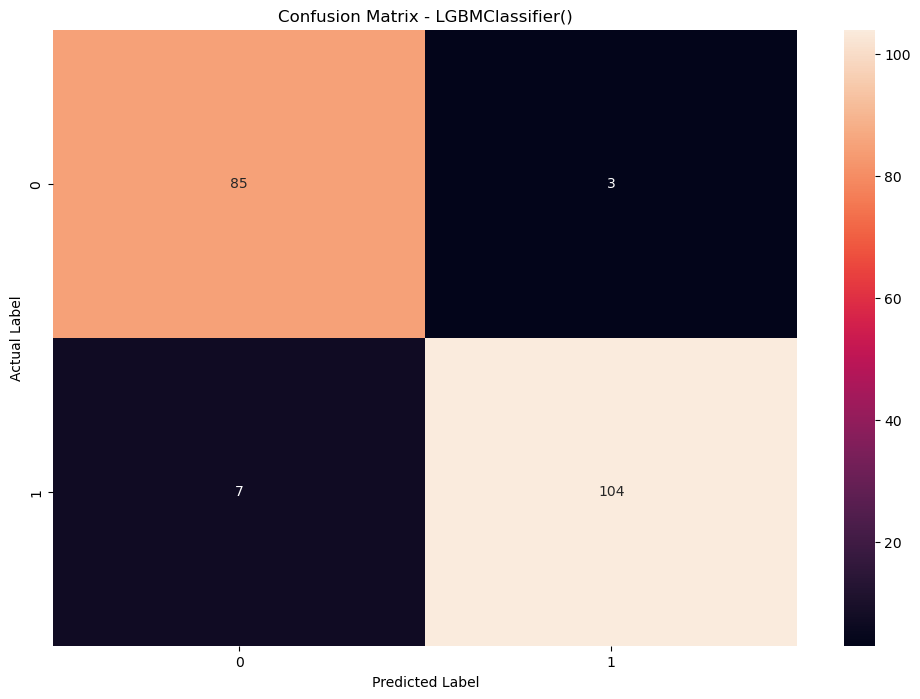

In [96]:
confusion1(lgbm_model)

In [97]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.fit_transform(X_test)
eval_classification1(lgbm_model, X_test_scaled, y_test,X_train_scaled, y_train)

Accuracy (Test Set): 0.56
Accuracy (Train Set): 0.48
Precision (Test Set): 0.56
Recall (Test Set): 1.00
Recall (Train Set): 1.00
F1-Score (Test Set): 0.72
roc_auc (test-proba): 0.51
roc_auc (train-proba): 0.54
[LightGBM] [Info] Number of positive: 304, number of negative: 329
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000313 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 785
[LightGBM] [Info] Number of data points in the train set: 633, number of used features: 31
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.480253 -> initscore=-0.079030
[LightGBM] [Info] Start training from score -0.079030
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Li

In [98]:
from sklearn.model_selection import GridSearchCV

# Define the LightGBM classifier with hyperparameters to tune
lgbm_model = LGBMClassifier(random_state=123)
params = {
    'num_leaves': [10, 30, 50],
    'max_depth': [None, 5, 10],
    'learning_rate': [0.01, 0.1, 0.5],
    'n_estimators': [100, 500, 1000]
}

# Perform grid search with cross-validation
grid_search = GridSearchCV(lgbm_model, params, cv=5, scoring='accuracy')
grid_search.fit(X_train, y_train)

# Print the best hyperparameters and evaluation score
print('Best hyperparameters:', grid_search.best_params_)
print('Best evaluation score:', grid_search.best_score_)

# Train the LightGBM classifier with the best hyperparameters
lgbm_best = grid_search.best_estimator_
lgbm_best.fit(X_train, y_train)

# Evaluate the model on the test set
eval_classification1(lgbm_best, X_test, y_test, X_train, y_train)

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 304, number of negative: 329
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000092 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 764
[LightGBM] [Info] Number of data points in the train set: 633, number of used features: 33
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.480253 -> initscore=-0.079030
[LightGBM] [Info] Start training from score -0.079030
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 304, number of negative: 329
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000092 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 761
[LightGBM] [Info] Number of data points in the train set: 633, number of used features: 31


Accuracy: 95.48%
Precision: 98.11%
Recall: 93.69%
F1_Score: 95.85%
ROC_AUC: 98.56%


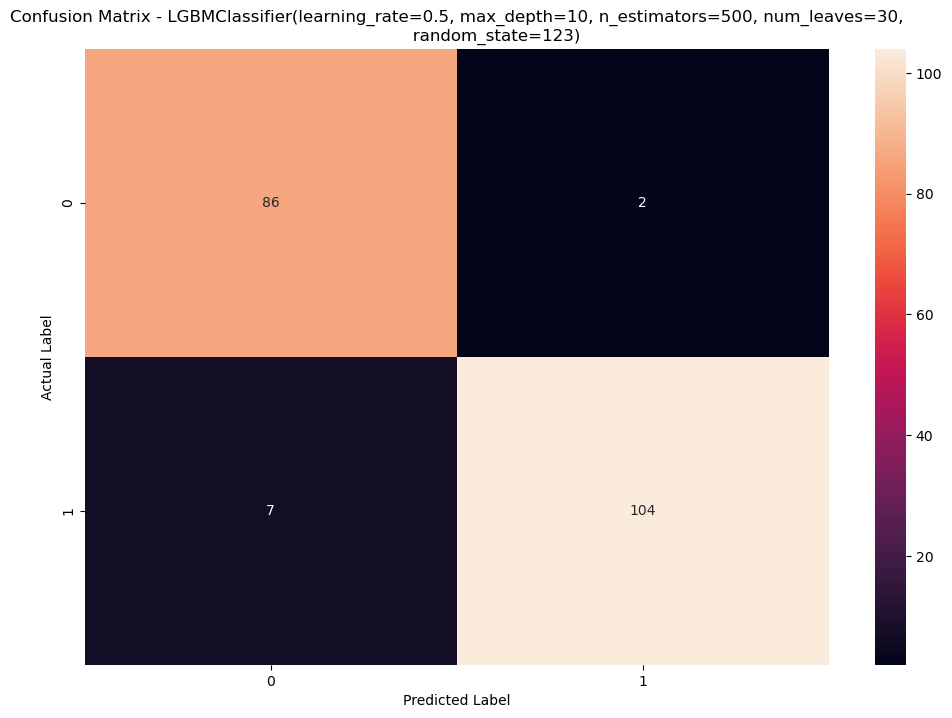

In [100]:
confusion1(lgbm_best)

# randomforest

In [101]:
from sklearn.ensemble import RandomForestClassifier
rf = RandomForestClassifier()
rf.fit(X_train,y_train)
eval_classification1(rf, X_test, y_test, X_train, y_train)

Accuracy (Test Set): 0.96
Accuracy (Train Set): 1.00
Precision (Test Set): 0.98
Recall (Test Set): 0.95
Recall (Train Set): 1.00
F1-Score (Test Set): 0.96
roc_auc (test-proba): 0.98
roc_auc (train-proba): 1.00
Accuracy (crossval train): 1.0
Accuracy (crossval test): 0.9617121779051563


Accuracy: 95.98%
Precision: 98.13%
Recall: 94.59%
F1_Score: 96.33%
ROC_AUC: 97.76%


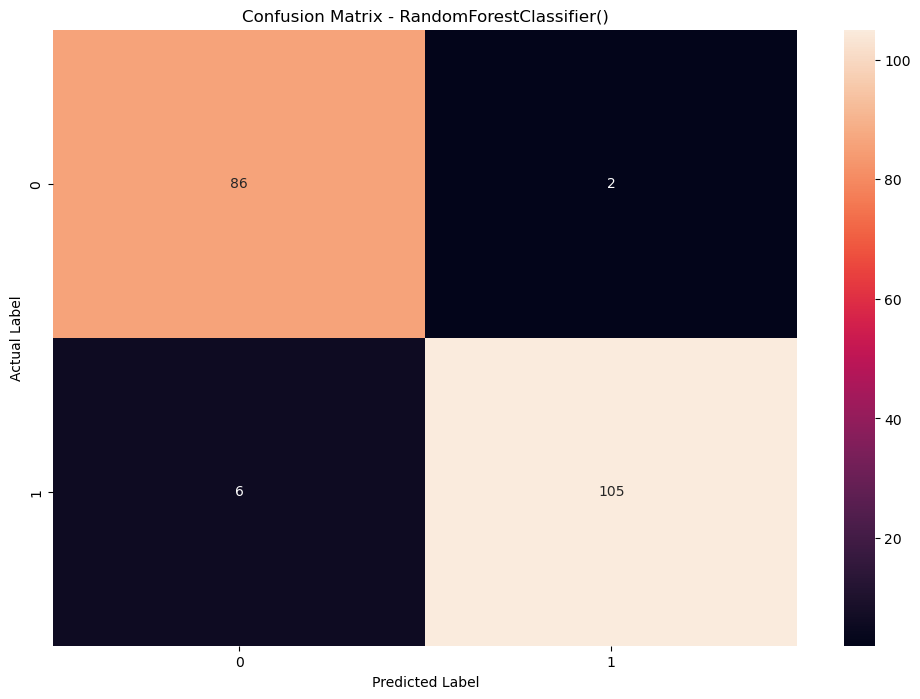

In [103]:
confusion1(rf)

In [104]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.fit_transform(X_test)
eval_classification1(rf, X_test_scaled, y_test,X_train_scaled, y_train)

C:\Users\PC\anaconda3\Lib\site-packages\sklearn\base.py:465: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
C:\Users\PC\anaconda3\Lib\site-packages\sklearn\base.py:465: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
C:\Users\PC\anaconda3\Lib\site-packages\sklearn\base.py:465: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
C:\Users\PC\anaconda3\Lib\site-packages\sklearn\base.py:465: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Accuracy (Test Set): 0.56
Accuracy (Train Set): 0.48
Precision (Test Set): 0.56
Recall (Test Set): 1.00
Recall (Train Set): 1.00
F1-Score (Test Set): 0.72
roc_auc (test-proba): 0.45
roc_auc (train-proba): 0.58
Accuracy (crossval train): 0.9998946814112691
Accuracy (crossval test): 0.9667648541782768


In [105]:
from sklearn.model_selection import GridSearchCV

# Define the Random Forest classifier with hyperparameters to tune
rf = RandomForestClassifier(random_state=123)
params = {
    'n_estimators': [100, 500, 1000],
    'max_depth': [None, 10, 20],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

# Perform grid search with cross-validation
grid_search = GridSearchCV(rf, params, cv=5, scoring='accuracy')
grid_search.fit(X_train, y_train)

# Print the best hyperparameters and evaluation score
print('Best hyperparameters:', grid_search.best_params_)
print('Best evaluation score:', grid_search.best_score_)

# Train the Random Forest classifier with the best hyperparameters
rf_best = grid_search.best_estimator_
rf_best.fit(X_train, y_train)

# Evaluate the model on the test set
eval_classification1(rf_best, X_test, y_test, X_train, y_train)

Best hyperparameters: {'max_depth': None, 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 500}
Best evaluation score: 0.9671602579412466
Accuracy (Test Set): 0.95
Accuracy (Train Set): 0.99
Precision (Test Set): 0.96
Recall (Test Set): 0.95
Recall (Train Set): 0.99
F1-Score (Test Set): 0.95
roc_auc (test-proba): 0.98
roc_auc (train-proba): 1.00
Accuracy (crossval train): 0.9927399943187766
Accuracy (crossval test): 0.9638139213969164


Accuracy: 94.97%
Precision: 96.33%
Recall: 94.59%
F1_Score: 95.45%
ROC_AUC: 98.41%


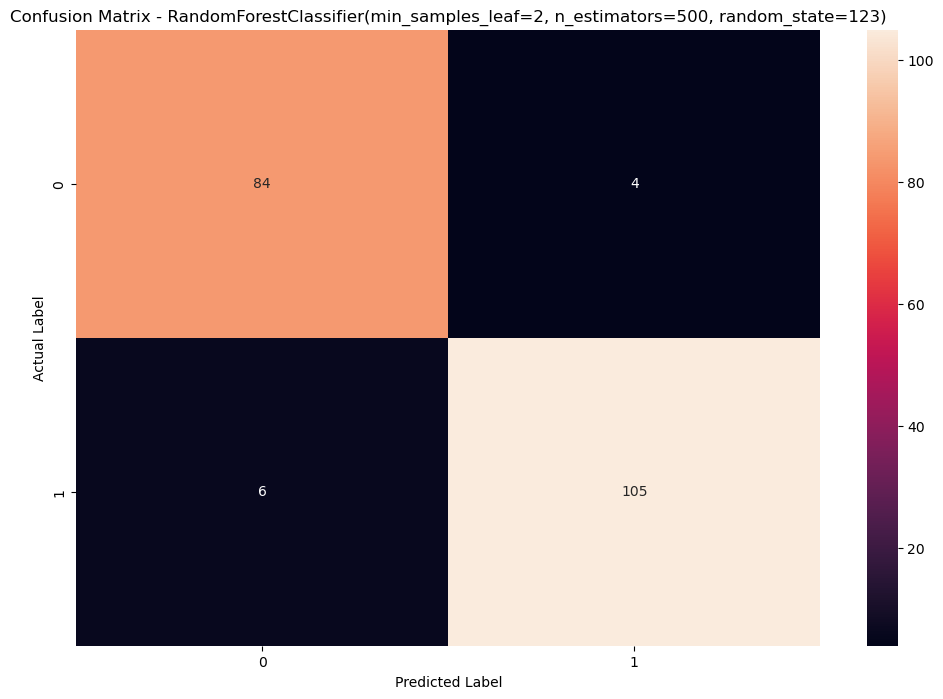

In [106]:
confusion1(rf_best)

# adaboost

In [107]:
from sklearn.ensemble import AdaBoostClassifier
ad = AdaBoostClassifier()
ad.fit(X_train,y_train)
eval_classification1(ad, X_test, y_test, X_train, y_train)

Accuracy (Test Set): 0.96
Accuracy (Train Set): 0.99
Precision (Test Set): 0.99
Recall (Test Set): 0.95
Recall (Train Set): 0.98
F1-Score (Test Set): 0.97
roc_auc (test-proba): 0.98
roc_auc (train-proba): 1.00
Accuracy (crossval train): 0.9970550663390828
Accuracy (crossval test): 0.9579173632672559


Accuracy: 96.48%
Precision: 99.06%
Recall: 94.59%
F1_Score: 96.77%
ROC_AUC: 97.98%


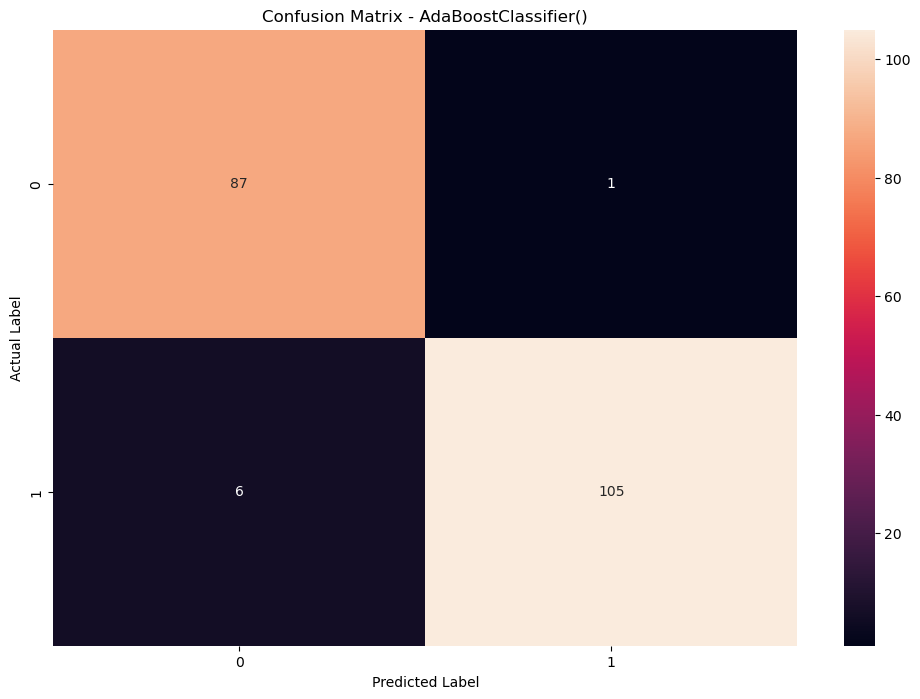

In [109]:
confusion1(ad)

In [110]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.fit_transform(X_test)
eval_classification1(ad, X_test_scaled, y_test,X_train_scaled, y_train)


C:\Users\PC\anaconda3\Lib\site-packages\sklearn\base.py:465: UserWarning: X does not have valid feature names, but AdaBoostClassifier was fitted with feature names
  warnings.warn(
C:\Users\PC\anaconda3\Lib\site-packages\sklearn\base.py:465: UserWarning: X does not have valid feature names, but AdaBoostClassifier was fitted with feature names
  warnings.warn(
C:\Users\PC\anaconda3\Lib\site-packages\sklearn\base.py:465: UserWarning: X does not have valid feature names, but AdaBoostClassifier was fitted with feature names
  warnings.warn(
C:\Users\PC\anaconda3\Lib\site-packages\sklearn\base.py:465: UserWarning: X does not have valid feature names, but AdaBoostClassifier was fitted with feature names
  warnings.warn(


Accuracy (Test Set): 0.56
Accuracy (Train Set): 0.48
Precision (Test Set): 0.56
Recall (Test Set): 1.00
Recall (Train Set): 1.00
F1-Score (Test Set): 0.72
roc_auc (test-proba): 0.56
roc_auc (train-proba): 0.51
Accuracy (crossval train): 0.9970550663390828
Accuracy (crossval test): 0.9579173632672559


In [111]:
from sklearn.ensemble import AdaBoostClassifier
from sklearn.model_selection import GridSearchCV

# Initialize AdaBoost classifier
base_estimator = DecisionTreeClassifier(max_depth=1)
n_estimators = 50
ada_classifier = AdaBoostClassifier(base_estimator=base_estimator, n_estimators=n_estimators)

# Define the hyperparameter grid
param_grid = {
    'n_estimators': [100, 200, 300],
    'learning_rate': [0.1, 0.5, 1],
    'algorithm': ['SAMME', 'SAMME.R'],
}

# Use GridSearchCV to find the best hyperparameters
grid_search = GridSearchCV(estimator=ada_classifier, param_grid=param_grid, cv=5, scoring='accuracy', verbose=2)
grid_search.fit(X_train, y_train)

# Print the best hyperparameters
print("Best hyperparameters: ", grid_search.best_params_)

# Now you can use the best model to make predictions
best_model1 = grid_search.best_estimator_
best_model1.fit(X_train, y_train)
y_pred = best_model1.predict(X_test)

# Evaluate the model using your evaluation function
eval_classification1(best_model1, X_test, y_test, X_train, y_train)

Fitting 5 folds for each of 18 candidates, totalling 90 fits


C:\Users\PC\anaconda3\Lib\site-packages\sklearn\ensemble\_base.py:156: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(


[CV] END algorithm=SAMME, learning_rate=0.1, n_estimators=100; total time=   0.2s


C:\Users\PC\anaconda3\Lib\site-packages\sklearn\ensemble\_base.py:156: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(


[CV] END algorithm=SAMME, learning_rate=0.1, n_estimators=100; total time=   0.2s


C:\Users\PC\anaconda3\Lib\site-packages\sklearn\ensemble\_base.py:156: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(


[CV] END algorithm=SAMME, learning_rate=0.1, n_estimators=100; total time=   0.2s


C:\Users\PC\anaconda3\Lib\site-packages\sklearn\ensemble\_base.py:156: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(


[CV] END algorithm=SAMME, learning_rate=0.1, n_estimators=100; total time=   0.2s


C:\Users\PC\anaconda3\Lib\site-packages\sklearn\ensemble\_base.py:156: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(


[CV] END algorithm=SAMME, learning_rate=0.1, n_estimators=100; total time=   0.2s


C:\Users\PC\anaconda3\Lib\site-packages\sklearn\ensemble\_base.py:156: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(


[CV] END algorithm=SAMME, learning_rate=0.1, n_estimators=200; total time=   0.4s


C:\Users\PC\anaconda3\Lib\site-packages\sklearn\ensemble\_base.py:156: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(


[CV] END algorithm=SAMME, learning_rate=0.1, n_estimators=200; total time=   0.4s


C:\Users\PC\anaconda3\Lib\site-packages\sklearn\ensemble\_base.py:156: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(


[CV] END algorithm=SAMME, learning_rate=0.1, n_estimators=200; total time=   0.4s


C:\Users\PC\anaconda3\Lib\site-packages\sklearn\ensemble\_base.py:156: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(


[CV] END algorithm=SAMME, learning_rate=0.1, n_estimators=200; total time=   0.4s


C:\Users\PC\anaconda3\Lib\site-packages\sklearn\ensemble\_base.py:156: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(


[CV] END algorithm=SAMME, learning_rate=0.1, n_estimators=200; total time=   0.4s


C:\Users\PC\anaconda3\Lib\site-packages\sklearn\ensemble\_base.py:156: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(


[CV] END algorithm=SAMME, learning_rate=0.1, n_estimators=300; total time=   0.7s


C:\Users\PC\anaconda3\Lib\site-packages\sklearn\ensemble\_base.py:156: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(


[CV] END algorithm=SAMME, learning_rate=0.1, n_estimators=300; total time=   0.7s


C:\Users\PC\anaconda3\Lib\site-packages\sklearn\ensemble\_base.py:156: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(


[CV] END algorithm=SAMME, learning_rate=0.1, n_estimators=300; total time=   0.7s


C:\Users\PC\anaconda3\Lib\site-packages\sklearn\ensemble\_base.py:156: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(


[CV] END algorithm=SAMME, learning_rate=0.1, n_estimators=300; total time=   0.7s


C:\Users\PC\anaconda3\Lib\site-packages\sklearn\ensemble\_base.py:156: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(


[CV] END algorithm=SAMME, learning_rate=0.1, n_estimators=300; total time=   0.7s


C:\Users\PC\anaconda3\Lib\site-packages\sklearn\ensemble\_base.py:156: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(


[CV] END algorithm=SAMME, learning_rate=0.5, n_estimators=100; total time=   0.2s


C:\Users\PC\anaconda3\Lib\site-packages\sklearn\ensemble\_base.py:156: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(


[CV] END algorithm=SAMME, learning_rate=0.5, n_estimators=100; total time=   0.2s


C:\Users\PC\anaconda3\Lib\site-packages\sklearn\ensemble\_base.py:156: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(


[CV] END algorithm=SAMME, learning_rate=0.5, n_estimators=100; total time=   0.2s


C:\Users\PC\anaconda3\Lib\site-packages\sklearn\ensemble\_base.py:156: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(


[CV] END algorithm=SAMME, learning_rate=0.5, n_estimators=100; total time=   0.2s


C:\Users\PC\anaconda3\Lib\site-packages\sklearn\ensemble\_base.py:156: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(


[CV] END algorithm=SAMME, learning_rate=0.5, n_estimators=100; total time=   0.2s


C:\Users\PC\anaconda3\Lib\site-packages\sklearn\ensemble\_base.py:156: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(


[CV] END algorithm=SAMME, learning_rate=0.5, n_estimators=200; total time=   0.4s


C:\Users\PC\anaconda3\Lib\site-packages\sklearn\ensemble\_base.py:156: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(


[CV] END algorithm=SAMME, learning_rate=0.5, n_estimators=200; total time=   0.4s


C:\Users\PC\anaconda3\Lib\site-packages\sklearn\ensemble\_base.py:156: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(


[CV] END algorithm=SAMME, learning_rate=0.5, n_estimators=200; total time=   0.4s


C:\Users\PC\anaconda3\Lib\site-packages\sklearn\ensemble\_base.py:156: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(


[CV] END algorithm=SAMME, learning_rate=0.5, n_estimators=200; total time=   0.4s


C:\Users\PC\anaconda3\Lib\site-packages\sklearn\ensemble\_base.py:156: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(


[CV] END algorithm=SAMME, learning_rate=0.5, n_estimators=200; total time=   0.4s


C:\Users\PC\anaconda3\Lib\site-packages\sklearn\ensemble\_base.py:156: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(


[CV] END algorithm=SAMME, learning_rate=0.5, n_estimators=300; total time=   0.7s


C:\Users\PC\anaconda3\Lib\site-packages\sklearn\ensemble\_base.py:156: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(


[CV] END algorithm=SAMME, learning_rate=0.5, n_estimators=300; total time=   0.6s


C:\Users\PC\anaconda3\Lib\site-packages\sklearn\ensemble\_base.py:156: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(


[CV] END algorithm=SAMME, learning_rate=0.5, n_estimators=300; total time=   0.6s


C:\Users\PC\anaconda3\Lib\site-packages\sklearn\ensemble\_base.py:156: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(


[CV] END algorithm=SAMME, learning_rate=0.5, n_estimators=300; total time=   0.6s


C:\Users\PC\anaconda3\Lib\site-packages\sklearn\ensemble\_base.py:156: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(


[CV] END algorithm=SAMME, learning_rate=0.5, n_estimators=300; total time=   0.6s


C:\Users\PC\anaconda3\Lib\site-packages\sklearn\ensemble\_base.py:156: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(


[CV] END .algorithm=SAMME, learning_rate=1, n_estimators=100; total time=   0.2s


C:\Users\PC\anaconda3\Lib\site-packages\sklearn\ensemble\_base.py:156: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(


[CV] END .algorithm=SAMME, learning_rate=1, n_estimators=100; total time=   0.2s


C:\Users\PC\anaconda3\Lib\site-packages\sklearn\ensemble\_base.py:156: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(


[CV] END .algorithm=SAMME, learning_rate=1, n_estimators=100; total time=   0.2s


C:\Users\PC\anaconda3\Lib\site-packages\sklearn\ensemble\_base.py:156: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(


[CV] END .algorithm=SAMME, learning_rate=1, n_estimators=100; total time=   0.2s


C:\Users\PC\anaconda3\Lib\site-packages\sklearn\ensemble\_base.py:156: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(


[CV] END .algorithm=SAMME, learning_rate=1, n_estimators=100; total time=   0.2s


C:\Users\PC\anaconda3\Lib\site-packages\sklearn\ensemble\_base.py:156: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(


[CV] END .algorithm=SAMME, learning_rate=1, n_estimators=200; total time=   0.4s


C:\Users\PC\anaconda3\Lib\site-packages\sklearn\ensemble\_base.py:156: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(


[CV] END .algorithm=SAMME, learning_rate=1, n_estimators=200; total time=   0.4s


C:\Users\PC\anaconda3\Lib\site-packages\sklearn\ensemble\_base.py:156: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(


[CV] END .algorithm=SAMME, learning_rate=1, n_estimators=200; total time=   0.4s


C:\Users\PC\anaconda3\Lib\site-packages\sklearn\ensemble\_base.py:156: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(


[CV] END .algorithm=SAMME, learning_rate=1, n_estimators=200; total time=   0.4s


C:\Users\PC\anaconda3\Lib\site-packages\sklearn\ensemble\_base.py:156: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(


[CV] END .algorithm=SAMME, learning_rate=1, n_estimators=200; total time=   0.4s


C:\Users\PC\anaconda3\Lib\site-packages\sklearn\ensemble\_base.py:156: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(


[CV] END .algorithm=SAMME, learning_rate=1, n_estimators=300; total time=   0.7s


C:\Users\PC\anaconda3\Lib\site-packages\sklearn\ensemble\_base.py:156: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(


[CV] END .algorithm=SAMME, learning_rate=1, n_estimators=300; total time=   0.7s


C:\Users\PC\anaconda3\Lib\site-packages\sklearn\ensemble\_base.py:156: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(


[CV] END .algorithm=SAMME, learning_rate=1, n_estimators=300; total time=   0.6s


C:\Users\PC\anaconda3\Lib\site-packages\sklearn\ensemble\_base.py:156: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(


[CV] END .algorithm=SAMME, learning_rate=1, n_estimators=300; total time=   0.6s


C:\Users\PC\anaconda3\Lib\site-packages\sklearn\ensemble\_base.py:156: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(


[CV] END .algorithm=SAMME, learning_rate=1, n_estimators=300; total time=   0.6s


C:\Users\PC\anaconda3\Lib\site-packages\sklearn\ensemble\_base.py:156: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(


[CV] END algorithm=SAMME.R, learning_rate=0.1, n_estimators=100; total time=   0.2s


C:\Users\PC\anaconda3\Lib\site-packages\sklearn\ensemble\_base.py:156: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(


[CV] END algorithm=SAMME.R, learning_rate=0.1, n_estimators=100; total time=   0.2s


C:\Users\PC\anaconda3\Lib\site-packages\sklearn\ensemble\_base.py:156: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(


[CV] END algorithm=SAMME.R, learning_rate=0.1, n_estimators=100; total time=   0.2s


C:\Users\PC\anaconda3\Lib\site-packages\sklearn\ensemble\_base.py:156: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(


[CV] END algorithm=SAMME.R, learning_rate=0.1, n_estimators=100; total time=   0.2s


C:\Users\PC\anaconda3\Lib\site-packages\sklearn\ensemble\_base.py:156: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(


[CV] END algorithm=SAMME.R, learning_rate=0.1, n_estimators=100; total time=   0.2s


C:\Users\PC\anaconda3\Lib\site-packages\sklearn\ensemble\_base.py:156: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(


[CV] END algorithm=SAMME.R, learning_rate=0.1, n_estimators=200; total time=   0.4s


C:\Users\PC\anaconda3\Lib\site-packages\sklearn\ensemble\_base.py:156: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(


[CV] END algorithm=SAMME.R, learning_rate=0.1, n_estimators=200; total time=   0.4s


C:\Users\PC\anaconda3\Lib\site-packages\sklearn\ensemble\_base.py:156: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(


[CV] END algorithm=SAMME.R, learning_rate=0.1, n_estimators=200; total time=   0.4s


C:\Users\PC\anaconda3\Lib\site-packages\sklearn\ensemble\_base.py:156: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(


[CV] END algorithm=SAMME.R, learning_rate=0.1, n_estimators=200; total time=   0.4s


C:\Users\PC\anaconda3\Lib\site-packages\sklearn\ensemble\_base.py:156: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(


[CV] END algorithm=SAMME.R, learning_rate=0.1, n_estimators=200; total time=   0.4s


C:\Users\PC\anaconda3\Lib\site-packages\sklearn\ensemble\_base.py:156: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(


[CV] END algorithm=SAMME.R, learning_rate=0.1, n_estimators=300; total time=   0.7s


C:\Users\PC\anaconda3\Lib\site-packages\sklearn\ensemble\_base.py:156: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(


[CV] END algorithm=SAMME.R, learning_rate=0.1, n_estimators=300; total time=   0.7s


C:\Users\PC\anaconda3\Lib\site-packages\sklearn\ensemble\_base.py:156: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(


[CV] END algorithm=SAMME.R, learning_rate=0.1, n_estimators=300; total time=   0.7s


C:\Users\PC\anaconda3\Lib\site-packages\sklearn\ensemble\_base.py:156: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(


[CV] END algorithm=SAMME.R, learning_rate=0.1, n_estimators=300; total time=   0.7s


C:\Users\PC\anaconda3\Lib\site-packages\sklearn\ensemble\_base.py:156: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(


[CV] END algorithm=SAMME.R, learning_rate=0.1, n_estimators=300; total time=   0.7s


C:\Users\PC\anaconda3\Lib\site-packages\sklearn\ensemble\_base.py:156: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(


[CV] END algorithm=SAMME.R, learning_rate=0.5, n_estimators=100; total time=   0.2s


C:\Users\PC\anaconda3\Lib\site-packages\sklearn\ensemble\_base.py:156: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(


[CV] END algorithm=SAMME.R, learning_rate=0.5, n_estimators=100; total time=   0.2s


C:\Users\PC\anaconda3\Lib\site-packages\sklearn\ensemble\_base.py:156: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(


[CV] END algorithm=SAMME.R, learning_rate=0.5, n_estimators=100; total time=   0.2s


C:\Users\PC\anaconda3\Lib\site-packages\sklearn\ensemble\_base.py:156: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(


[CV] END algorithm=SAMME.R, learning_rate=0.5, n_estimators=100; total time=   0.2s


C:\Users\PC\anaconda3\Lib\site-packages\sklearn\ensemble\_base.py:156: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(


[CV] END algorithm=SAMME.R, learning_rate=0.5, n_estimators=100; total time=   0.2s


C:\Users\PC\anaconda3\Lib\site-packages\sklearn\ensemble\_base.py:156: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(


[CV] END algorithm=SAMME.R, learning_rate=0.5, n_estimators=200; total time=   0.4s


C:\Users\PC\anaconda3\Lib\site-packages\sklearn\ensemble\_base.py:156: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(


[CV] END algorithm=SAMME.R, learning_rate=0.5, n_estimators=200; total time=   0.4s


C:\Users\PC\anaconda3\Lib\site-packages\sklearn\ensemble\_base.py:156: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(


[CV] END algorithm=SAMME.R, learning_rate=0.5, n_estimators=200; total time=   0.4s


C:\Users\PC\anaconda3\Lib\site-packages\sklearn\ensemble\_base.py:156: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(


[CV] END algorithm=SAMME.R, learning_rate=0.5, n_estimators=200; total time=   0.4s


C:\Users\PC\anaconda3\Lib\site-packages\sklearn\ensemble\_base.py:156: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(


[CV] END algorithm=SAMME.R, learning_rate=0.5, n_estimators=200; total time=   0.4s


C:\Users\PC\anaconda3\Lib\site-packages\sklearn\ensemble\_base.py:156: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(


[CV] END algorithm=SAMME.R, learning_rate=0.5, n_estimators=300; total time=   0.7s


C:\Users\PC\anaconda3\Lib\site-packages\sklearn\ensemble\_base.py:156: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(


[CV] END algorithm=SAMME.R, learning_rate=0.5, n_estimators=300; total time=   0.7s


C:\Users\PC\anaconda3\Lib\site-packages\sklearn\ensemble\_base.py:156: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(


[CV] END algorithm=SAMME.R, learning_rate=0.5, n_estimators=300; total time=   0.7s


C:\Users\PC\anaconda3\Lib\site-packages\sklearn\ensemble\_base.py:156: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(


[CV] END algorithm=SAMME.R, learning_rate=0.5, n_estimators=300; total time=   0.7s


C:\Users\PC\anaconda3\Lib\site-packages\sklearn\ensemble\_base.py:156: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(


[CV] END algorithm=SAMME.R, learning_rate=0.5, n_estimators=300; total time=   0.7s


C:\Users\PC\anaconda3\Lib\site-packages\sklearn\ensemble\_base.py:156: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(


[CV] END algorithm=SAMME.R, learning_rate=1, n_estimators=100; total time=   0.2s


C:\Users\PC\anaconda3\Lib\site-packages\sklearn\ensemble\_base.py:156: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(


[CV] END algorithm=SAMME.R, learning_rate=1, n_estimators=100; total time=   0.2s


C:\Users\PC\anaconda3\Lib\site-packages\sklearn\ensemble\_base.py:156: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(


[CV] END algorithm=SAMME.R, learning_rate=1, n_estimators=100; total time=   0.2s


C:\Users\PC\anaconda3\Lib\site-packages\sklearn\ensemble\_base.py:156: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(


[CV] END algorithm=SAMME.R, learning_rate=1, n_estimators=100; total time=   0.2s


C:\Users\PC\anaconda3\Lib\site-packages\sklearn\ensemble\_base.py:156: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(


[CV] END algorithm=SAMME.R, learning_rate=1, n_estimators=100; total time=   0.2s


C:\Users\PC\anaconda3\Lib\site-packages\sklearn\ensemble\_base.py:156: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(


[CV] END algorithm=SAMME.R, learning_rate=1, n_estimators=200; total time=   0.4s


C:\Users\PC\anaconda3\Lib\site-packages\sklearn\ensemble\_base.py:156: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(


[CV] END algorithm=SAMME.R, learning_rate=1, n_estimators=200; total time=   0.4s


C:\Users\PC\anaconda3\Lib\site-packages\sklearn\ensemble\_base.py:156: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(


[CV] END algorithm=SAMME.R, learning_rate=1, n_estimators=200; total time=   0.4s


C:\Users\PC\anaconda3\Lib\site-packages\sklearn\ensemble\_base.py:156: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(


[CV] END algorithm=SAMME.R, learning_rate=1, n_estimators=200; total time=   0.4s


C:\Users\PC\anaconda3\Lib\site-packages\sklearn\ensemble\_base.py:156: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(


[CV] END algorithm=SAMME.R, learning_rate=1, n_estimators=200; total time=   0.4s


C:\Users\PC\anaconda3\Lib\site-packages\sklearn\ensemble\_base.py:156: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(


[CV] END algorithm=SAMME.R, learning_rate=1, n_estimators=300; total time=   0.7s


C:\Users\PC\anaconda3\Lib\site-packages\sklearn\ensemble\_base.py:156: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(


[CV] END algorithm=SAMME.R, learning_rate=1, n_estimators=300; total time=   0.7s


C:\Users\PC\anaconda3\Lib\site-packages\sklearn\ensemble\_base.py:156: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(


[CV] END algorithm=SAMME.R, learning_rate=1, n_estimators=300; total time=   0.7s


C:\Users\PC\anaconda3\Lib\site-packages\sklearn\ensemble\_base.py:156: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(


[CV] END algorithm=SAMME.R, learning_rate=1, n_estimators=300; total time=   0.7s


C:\Users\PC\anaconda3\Lib\site-packages\sklearn\ensemble\_base.py:156: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(


[CV] END algorithm=SAMME.R, learning_rate=1, n_estimators=300; total time=   0.7s


C:\Users\PC\anaconda3\Lib\site-packages\sklearn\ensemble\_base.py:156: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(


Best hyperparameters:  {'algorithm': 'SAMME', 'learning_rate': 0.5, 'n_estimators': 100}


C:\Users\PC\anaconda3\Lib\site-packages\sklearn\ensemble\_base.py:156: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(


Accuracy (Test Set): 0.94
Accuracy (Train Set): 0.97
Precision (Test Set): 0.97
Recall (Test Set): 0.93
Recall (Train Set): 0.96
F1-Score (Test Set): 0.95
roc_auc (test-proba): 0.98
roc_auc (train-proba): 1.00


C:\Users\PC\anaconda3\Lib\site-packages\sklearn\ensemble\_base.py:156: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\PC\anaconda3\Lib\site-packages\sklearn\ensemble\_base.py:156: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\PC\anaconda3\Lib\site-packages\sklearn\ensemble\_base.py:156: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\PC\anaconda3\Lib\site-packages\sklearn\ensemble\_base.py:156: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\PC\anaconda3\Lib\site-packages\sklearn\ensemble\_base.py:156: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\PC\anaconda3\Lib\site-packages\sklearn\en

Accuracy (crossval train): 0.9758001471802359
Accuracy (crossval test): 0.957914709550726


Accuracy: 94.47%
Precision: 97.17%
Recall: 92.79%
F1_Score: 94.93%
ROC_AUC: 98.18%


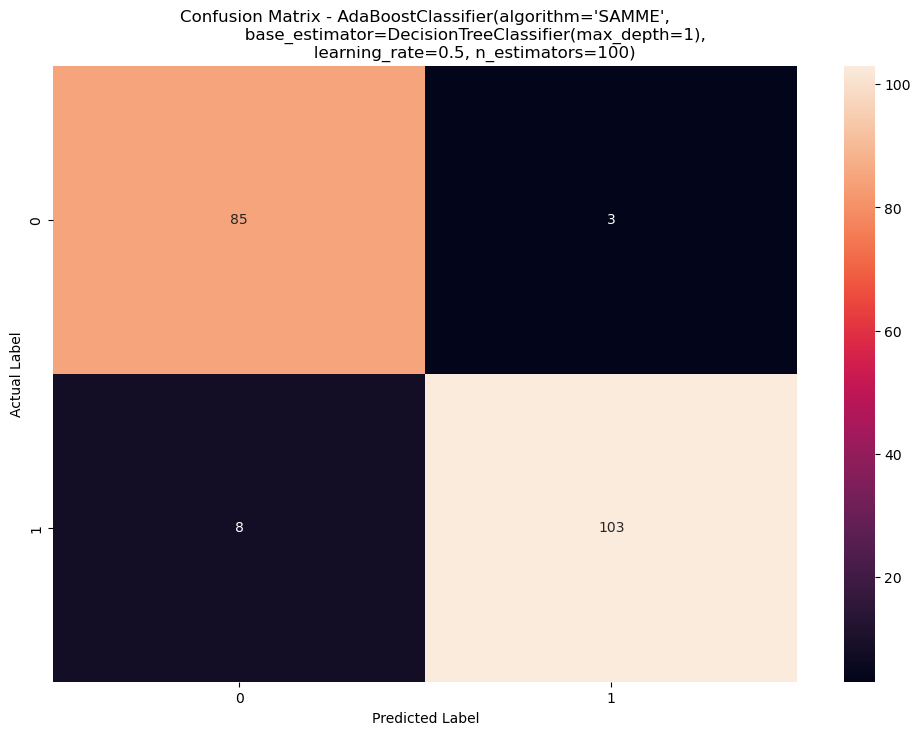

In [113]:
confusion1(best_model1)

# xgboost

In [114]:
import xgboost as xgb

# Create an instance of the XGBoost classifier
xgb_classifier = xgb.XGBClassifier()

# Fit the classifier on the training data
xgb_classifier.fit(X_train, y_train)

# Now you can use your evaluation function
eval_classification1(xgb_classifier, X_test, y_test, X_train, y_train)


Accuracy (Test Set): 0.94
Accuracy (Train Set): 1.00
Precision (Test Set): 0.96
Recall (Test Set): 0.94
Recall (Train Set): 1.00
F1-Score (Test Set): 0.95
roc_auc (test-proba): 0.99
roc_auc (train-proba): 1.00
Accuracy (crossval train): 1.0
Accuracy (crossval test): 0.9579200169837858


Accuracy: 94.47%
Precision: 96.30%
Recall: 93.69%
F1_Score: 94.98%
ROC_AUC: 98.69%


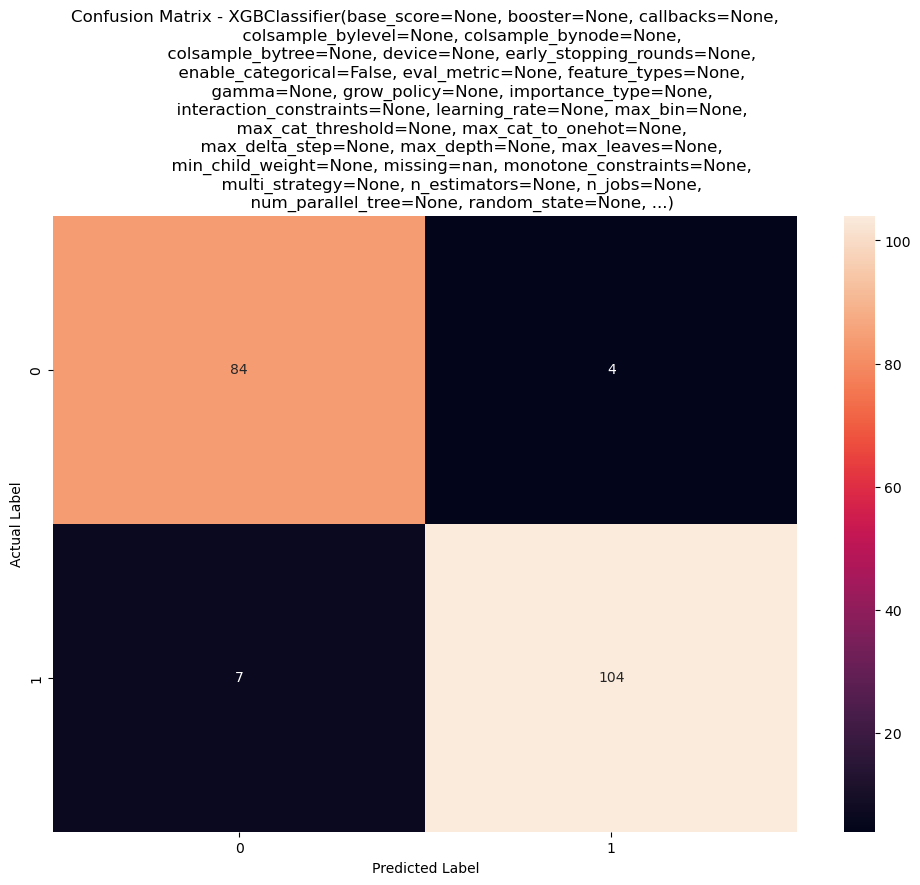

In [116]:
confusion1(xgb_classifier)

In [117]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.fit_transform(X_test)
eval_classification1(xgb_classifier, X_test_scaled, y_test,X_train_scaled, y_train)

Accuracy (Test Set): 0.56
Accuracy (Train Set): 0.48
Precision (Test Set): 0.56
Recall (Test Set): 1.00
Recall (Train Set): 1.00
F1-Score (Test Set): 0.72
roc_auc (test-proba): 0.47
roc_auc (train-proba): 0.52
Accuracy (crossval train): 1.0
Accuracy (crossval test): 0.9579200169837858


In [118]:
import xgboost as xgb
from sklearn.model_selection import GridSearchCV

# Create an instance of the XGBoost classifier
xgb_classifier = xgb.XGBClassifier()

# Define the hyperparameter grid
param_grid = {
    'learning_rate': [0.01, 0.1, 0.5, 1],
    'n_estimators': [50, 100, 200],
    'max_depth': [3, 5, 8],
    'gamma': [0, 0.1, 0.2],
    'min_child_weight': [1, 2, 3],
    'subsample': [0.5, 1],
    'colsample_bytree': [0.5, 1]
}

# Use GridSearchCV to find the best hyperparameters
grid_search = GridSearchCV(estimator=xgb_classifier, param_grid=param_grid, cv=5, scoring='accuracy', verbose=2)
grid_search.fit(X_train, y_train)

# Print the best hyperparameters
print("Best hyperparameters: ", grid_search.best_params_)

# Now you can use the best model to make predictions
best_model = grid_search.best_estimator_
best_model.fit(X_train, y_train)
y_pred = best_model.predict(X_test)

# Evaluate the model using your evaluation function
eval_classification1(best_model, X_test, y_test, X_train, y_train)

Fitting 5 folds for each of 1296 candidates, totalling 6480 fits
[CV] END colsample_bytree=0.5, gamma=0, learning_rate=0.01, max_depth=3, min_child_weight=1, n_estimators=50, subsample=0.5; total time=   0.0s
[CV] END colsample_bytree=0.5, gamma=0, learning_rate=0.01, max_depth=3, min_child_weight=1, n_estimators=50, subsample=0.5; total time=   0.0s
[CV] END colsample_bytree=0.5, gamma=0, learning_rate=0.01, max_depth=3, min_child_weight=1, n_estimators=50, subsample=0.5; total time=   0.0s
[CV] END colsample_bytree=0.5, gamma=0, learning_rate=0.01, max_depth=3, min_child_weight=1, n_estimators=50, subsample=0.5; total time=   0.0s
[CV] END colsample_bytree=0.5, gamma=0, learning_rate=0.01, max_depth=3, min_child_weight=1, n_estimators=50, subsample=0.5; total time=   0.0s
[CV] END colsample_bytree=0.5, gamma=0, learning_rate=0.01, max_depth=3, min_child_weight=1, n_estimators=50, subsample=1; total time=   0.0s
[CV] END colsample_bytree=0.5, gamma=0, learning_rate=0.01, max_depth=3, 

Accuracy: 95.48%
Precision: 97.22%
Recall: 94.59%
F1_Score: 95.89%
ROC_AUC: 98.63%


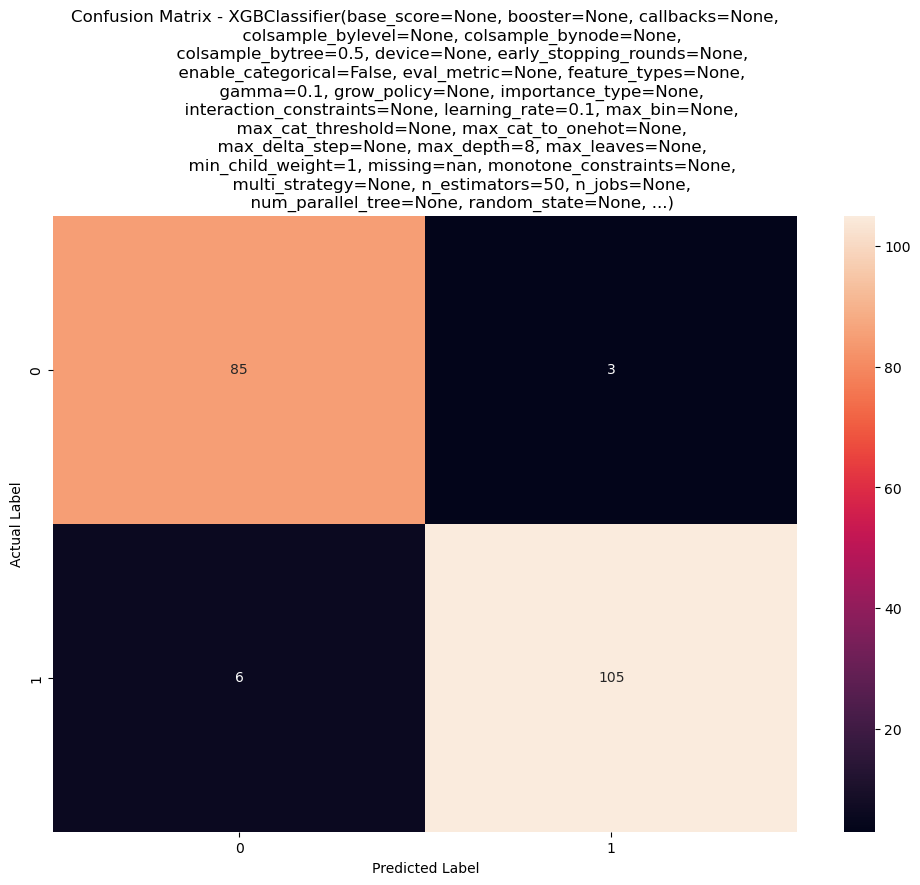

In [120]:
confusion1(best_model)

C:\Users\PC\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\PC\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\PC\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


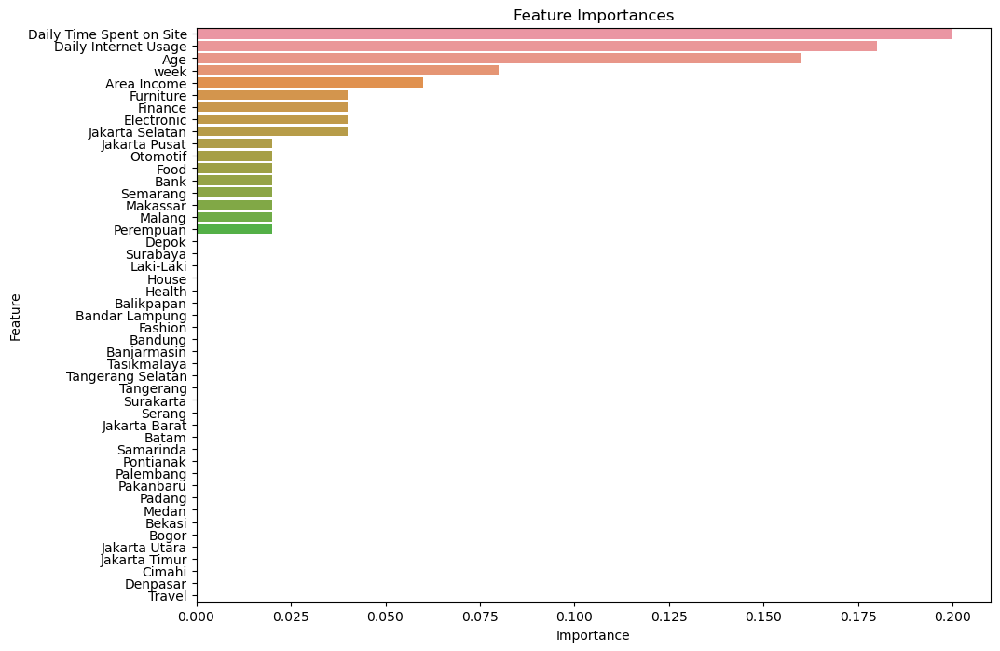

In [121]:
from sklearn.ensemble import AdaBoostClassifier
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Assuming X_train is a DataFrame and you have already defined and scaled your training and test sets (X_train_scaled, X_test_scaled, y_train)

# Create and fit the model
modelad = AdaBoostClassifier()
modelad.fit(X_train_scaled, y_train)

# Get feature importances
feature_importance = modelad.feature_importances_

# Get the column names (feature names) from the DataFrame
feature_names = x_data.columns

# Create a DataFrame for better visualization
feature_importance_df = pd.DataFrame({'Feature': feature_names, 'Importance': feature_importance})

# Sort the DataFrame by importance
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)

# Plot the feature importances
plt.figure(figsize=(11, 8))
sns.barplot(x='Importance', y='Feature', data=feature_importance_df)
plt.title('Feature Importances')
plt.show()

